Lesson 8 - Applied Regression Modeling -  Marginal Model Plots

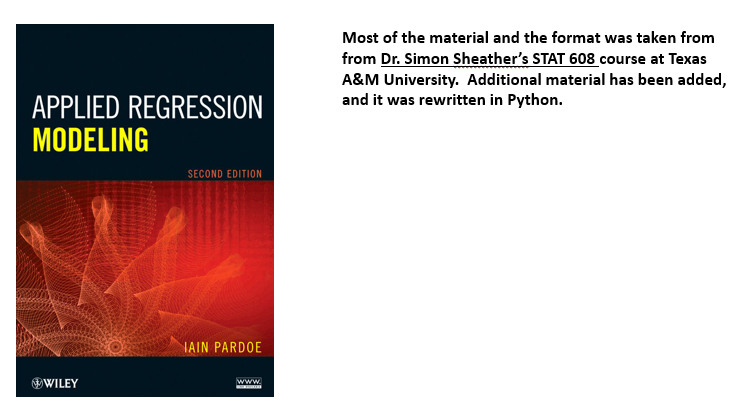

In [1]:
import pandas as pd
import numpy as np
import datetime as dt

import statsmodels.api as sm   

import matplotlib.ticker as ticker
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor

from IPython.display import HTML

from pandas_datareader import data
import matplotlib.ticker as ticker

# Definitions

In [2]:
def num_columns(series):
    """
    returns the number of columns in a series or dataframe
    """
    
    try: return series.shape[1]
    except: return 1

In [3]:
def make_number(series):
    
    """ this function is used to apply to a column of data to convrt it to a float value.
    It converts the value to a 0 if it is a string that cannot be converted."""
    
    try: return float(series)
    except: return 0

In [4]:
def clean_data(series, make_all_numbers):
    
    """ applies cleaning algorithms to series.     
        make_all_numbers == True makes all values a numerical value. If not a number it converts it to a zero.
    """
    
    if make_all_numbers: 
        series = series.map(make_number) if num_columns(y) == 1 else series.applymap(make_number)
    
    return series

In [5]:
def check_size(X,y):
    if (len(X.columns) < 1)and((len(y.columns)>1)):
        print("This won't work. You can't have more than one column of dependent variables, and you need to include independent variable(s) 'X' in your model.")
    elif(len(X.columns) < 1):
        print("This won't work. You need to include at least one column of values for your independent variable.")
    elif(len(y.columns) < 1):
        print("This won't work. You need one column of values for your independent variable.")        
    else:
        pass

In [6]:
def ols_model_fit(X,y, add_intercept=True):
    
    X = sm.add_constant(X) if add_intercept==True else X
    fitted_ols_model = sm.OLS(y, X).fit()
    
    return fitted_ols_model

In [7]:
def get_vifs(X, add_intercept):
    
    X = sm.add_constant(X) if add_intercept==True else X

    if ((X.columns[0] == 'const')and(len(X.columns)==2)):
        vifs = [np.nan, np.nan]
    
    elif (len(X.columns)==1):
        vifs = [np.nan]
        
    elif X.columns[0] == 'const':
        data = X.drop(columns = ['const']).copy()
        vifs = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
        vifs = [np.nan]+vifs
    else:
        data = X.copy()
        vifs = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
    
    vifs = pd.Series(vifs, index = X.columns.to_list(), name = 'VIF')
    
    return vifs

In [8]:
def get_summary_of_fit(X,y,fitted_ols_model, add_intercept):
    
    rsquared = fitted_ols_model.rsquared
    rsquared_adj = fitted_ols_model.rsquared_adj
    root_mean_square_error = (
        (mean_squared_error(y,fitted_ols_model.predict(sm.add_constant(X))))*0.5 if add_intercept==True 
        else (mean_squared_error(y,fitted_ols_model.predict(X)))*0.5
    )
    mean_of_response = round(y.mean(),5)
    num_observations = fitted_ols_model.nobs

    summary_of_fit_dict = {
        'RSquare':rsquared,
        'RSquare Adj':rsquared_adj,
        'Root Mean Square Error':root_mean_square_error,
        'Mean of Response':mean_of_response,
        'Observations (or Sum Wgts)':num_observations
    }

    summary_of_fit = pd.DataFrame(
        {
        ' ':list(summary_of_fit_dict.keys()),
        '':list(summary_of_fit_dict.values())
        }
    )

    return summary_of_fit, summary_of_fit_dict

In [9]:
def beautify_summary_of_fit(summary_of_fit):
    
    summary_of_fit[''] = round(summary_of_fit[''],6)
    summary_of_fit= summary_of_fit.astype(str)
    
    summary_of_fit[''].iloc[-1] = summary_of_fit[''].iloc[-1].replace('.0','')

    s = summary_of_fit.style.set_properties(**{'text-align': 'left'})
    s = s.set_caption('Summary of Fit').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    
    return s

In [10]:
def get_anova(fitted_ols_model):
    
    model_mse = round(fitted_ols_model.mse_model,3)
    resid_mse = round(fitted_ols_model.mse_resid,3)
    total_mse = round(fitted_ols_model.mse_total,3)

    model_df = int(fitted_ols_model.df_model)
    resid_df = int(fitted_ols_model.df_resid)
    total_df = int(model_df+resid_df)

    model_ss = round(model_mse*model_df,3)
    error_ss = round(resid_mse*resid_df,3)
    total_ss = round(total_mse*total_df,3)

    f_ratio = round(fitted_ols_model.fvalue,4)
    prob_f = round(fitted_ols_model.f_pvalue,4)

    source = ['Model','Error','C.Total']
    df = [model_df, resid_df, total_df]
    ss = [model_ss, error_ss, total_ss]
    ms = [model_ss, error_ss, '']
    fr = [f_ratio, 'Prob > F', prob_f]

    analysis_of_variance_dict = {
        'Source':source,
        'Deg of Freedom':df,
        'Sum of Squares':ss,
        'Mean Square':ms,
        'F Ratio':fr
    }
    
    analysis_of_variance = pd.DataFrame(analysis_of_variance_dict)
    
    return analysis_of_variance, analysis_of_variance_dict

In [11]:
def reformat_p_values(pvalue):

    if float(pvalue) < 0.0001:
        new_pvalue = '<.0001*'
        
    elif ((float(pvalue) >= 0.0001)and(float(pvalue) < 0.05)):
        pvalue = round(pvalue,4)
        new_pvalue = '{}*'.format(pvalue)
        
    else: 
        pvalue = round(pvalue,4)
        new_pvalue = str(pvalue)

    return new_pvalue

In [12]:
def color_p_values(val):
    
    if '*' in val:
        val = float(val.replace('<','').replace('*',''))
        if val < 0.01:
            color = 'darkorange'
        elif ((val >= 0.01)and(val < 0.05)):
            color = 'red'
        else:
            color = 'black'
        return 'color: %s' % color
    
    else:
        return 'color: black'  

In [13]:
def beautify_analysis_of_variance(analysis_of_variance):
    
    def reformat_p_values(pvalue):

        if float(pvalue) < 0.0001:
            new_pvalue = '<.0001*'

        elif ((float(pvalue) >= 0.0001)and(float(pvalue) < 0.05)):
            pvalue = round(pvalue,4)
            new_pvalue = '{}*'.format(pvalue)

        else: 
            pvalue = round(pvalue,4)
            new_pvalue = str(pvalue)

        return new_pvalue
    
    def color_p_values(val):
    
        if '*' in val:
            val = float(val.replace('<','').replace('*',''))
            if val < 0.01:
                color = 'darkorange'
            elif ((val >= 0.01)and(val < 0.05)):
                color = 'red'
            else:
                color = 'black'
            return 'color: %s' % color

        else:
            return 'color: black'  
    
    
    def bold_f_val(val):
        if val == 'Prob > F':
            return 'font-weight: bold'
        else:
            return 'font-weight: normal'
    
    pvalue=analysis_of_variance.iloc[2,4]
    new_pvalue = reformat_p_values(pvalue)
    analysis_of_variance.iloc[2,4] = new_pvalue
    analysis_of_variance['Sum of Squares'] = analysis_of_variance['Sum of Squares'].astype(str)
    analysis_of_variance['Mean Square'] = analysis_of_variance['Mean Square'].astype(str)
    analysis_of_variance['F Ratio'] = analysis_of_variance['F Ratio'].astype(str)
    s = analysis_of_variance.style.set_properties(**{'text-align': 'left'})
    s = s.applymap(color_p_values, subset = ['F Ratio'])
    s = s.applymap(bold_f_val, subset = ['F Ratio'])
    s = s.set_caption('Analysis of Variance').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    
    return s

In [14]:
def get_parameter_estimates(X,fitted_ols_model, add_intercept):

    terms = fitted_ols_model.params.index.to_list()
    estimates = fitted_ols_model.params.to_list()
    standard_errors = fitted_ols_model.bse.to_list()
    t_ratios = fitted_ols_model.tvalues.to_list()
    p_values = fitted_ols_model.pvalues.to_list()
    lower_95 = fitted_ols_model.conf_int(alpha = 0.5, cols = None)[0].to_list()
    upper_95 = fitted_ols_model.conf_int(alpha = 0.5, cols = None)[1].to_list()
    vifs = get_vifs(X, add_intercept).to_list()

    parameter_estimates_dict = {
        'Term':terms,
        'Estimate':estimates,
        'Std Error':standard_errors,
        't Ratio':t_ratios,
        'Prob > |t|':p_values,
        'Lower 95%':lower_95,
        'Upper 95%':upper_95,
        'VIF':vifs
    }

    parameter_estimates = pd.DataFrame(parameter_estimates_dict)
    
    return parameter_estimates, parameter_estimates_dict 

In [15]:
def reformat_vifs(vif):
    
    vif = round(vif,4)
    
    if str(vif) == 'nan':
        new_vif = '.'
        
    elif vif <=10:
        new_vif = '{}*'.format(vif)
        
    else: 
        new_vif = str(vif)
        
    return new_vif

In [16]:
def color_vifs(val):

    if '*' in val:
        val = float(val.replace('*',''))
        if val <=5.0:
            color = 'darkorange'
        elif ((val > 5.0)and(val <=10.0)):
            color = 'red'
        else:
            color = 'black'
        return 'color: %s' % color

    else:
        return 'color: black' 

In [17]:
def beautify_parameter_estimates(parameter_estimates):
    
    def reformat_p_values(pvalue):

        if float(pvalue) < 0.0001:
            new_pvalue = '<.0001*'

        elif ((float(pvalue) >= 0.0001)and(float(pvalue) < 0.05)):
            pvalue = round(pvalue,4)
            new_pvalue = '{}*'.format(pvalue)

        else: 
            pvalue = round(pvalue,4)
            new_pvalue = str(pvalue)

        return new_pvalue

    def color_p_values(val):

        if '*' in val:
            val = float(val.replace('<','').replace('*',''))
            if val < 0.01:
                color = 'darkorange'
            elif ((val >= 0.01)and(val < 0.05)):
                color = 'red'
            else:
                color = 'black'
            return 'color: %s' % color

        else:
            return 'color: black' 

    def reformat_vifs(vif):

        vif = round(vif,4)

        if str(vif) == 'nan':
            new_vif = '.'

        elif vif <=10:
            new_vif = '{}*'.format(vif)

        else: 
            new_vif = str(vif)

        return new_vif


    def color_vifs(val):

        if '*' in val:
            val = float(val.replace('*',''))
            if val <=5.0:
                color = 'darkorange'
            elif ((val > 5.0)and(val <=10.0)):
                color = 'red'
            else:
                color = 'black'
            return 'color: %s' % color

        else:
            return 'color: black' 

    parameter_estimates['Estimate'] = round(parameter_estimates['Estimate'],5)
    parameter_estimates['Std Error'] = round(parameter_estimates['Std Error'],5)
    parameter_estimates['t Ratio'] = round(parameter_estimates['t Ratio'],2)
    parameter_estimates['Prob > |t|'] = parameter_estimates['Prob > |t|'].apply(reformat_p_values)
    parameter_estimates['Lower 95%'] = round(parameter_estimates['Lower 95%'],5)
    parameter_estimates['Upper 95%'] = round(parameter_estimates['Upper 95%'],5)
    parameter_estimates['VIF'] = parameter_estimates['VIF'].apply(reformat_vifs)
    parameter_estimates = parameter_estimates.astype(str)
    parameter_estimates['Term'] = ['Intercept' if term == 'const' else term for term in parameter_estimates['Term'].to_list()]
    s = parameter_estimates.style.set_properties(**{'text-align': 'left'})
    s = s.applymap(color_p_values, subset = ['Prob > |t|'])
    s = s.applymap(color_vifs, subset = ['VIF'])
    s = s.set_caption('Parameter Estimates').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    
    return s

In [18]:
def get_results(y, fitted_ols_model):

    influence = fitted_ols_model.get_influence()                        
    results = pd.DataFrame()
    results['y'] = y                                                         # target variable
    results['yhat'] = fitted_ols_model.predict()                             # predictions
    results['residuals'] = results['y']-results['yhat']                      # residuals
    results['studentized_residuals'] = influence.resid_studentized_external  # studentized residuals
    results['cooks_distance']= influence.cooks_distance[0]                   # cook's distance

    return results

In [19]:
def make_diagnostic_plots(y, fitted_ols_model):
    
    results = get_results(y, fitted_ols_model)

    title = pd.DataFrame()
    s = title.style.set_properties(**{'text-align': 'left'})
    s = s.set_caption('Diagnostic Plots').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    display(s)

    with plt.style.context('ggplot'):

        fig = plt.figure(figsize = (8,7), dpi=200)
        #fig.suptitle('Diagnostic Plots', color = 'orange', fontsize=16, horizontalalignment = 'center')
        
        ax1 = plt.subplot2grid((4, 4), (0, 0), rowspan=2, colspan=2)
        ax2 = plt.subplot2grid((4, 4), (0, 2), rowspan=2, colspan=2)
        ax3 = plt.subplot2grid((4, 4), (2, 0), rowspan=2, colspan=3)
        ax4 = plt.subplot2grid((4, 4), (2, 3), rowspan=2, colspan=1)

        fmt = '{x:,.0f}'
        tick = ticker.StrMethodFormatter(fmt)
        residuals_limit = max(min(results.studentized_residuals), max(results.studentized_residuals))

        ax1.set_title('\nActual by Predicted Plot\n\n',fontsize = 10, color = 'darkorange')
        ax1.scatter(results.yhat, 
                    results.y, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax1.plot(results.yhat, results.yhat, color = 'r', linewidth = 0.80)
        ax1.ticklabel_format(useOffset=False, style='plain')
        ax1.yaxis.set_major_formatter(tick) 
        ax1.xaxis.set_major_formatter(tick) 
        ax1.set_xlabel('Predicted',fontsize = 10)
        ax1.set_ylabel('Actual',fontsize = 10)
        ax1.tick_params(axis='x', rotation=35)

        ax2.set_title("\nStudentized Residuals vs.\n Cook's Distance\n", fontsize = 10, color = 'darkorange')
        ax2.scatter(results.cooks_distance, 
                    results.studentized_residuals, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax2.axvline(x=0.5, color = 'salmon', linestyle = '--', label = "Cook's D = 0.5", linewidth = 1.5)
        ax2.axvline(x=1.0, color = 'salmon', linestyle = '-', label = "Cook's D = 1.0", linewidth = 1.5)
        ax2.set_xlabel("Cook's Distance",fontsize = 10)
        ax2.set_ylabel('\nStudentized Residuals',fontsize = 10)
        ax2.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax2.tick_params(axis='x', rotation=35)
        ax2.legend(loc = 5)

        ax3.set_title('\nStudentized Residuals vs. \nPredicted\n',fontsize = 10, color = 'darkorange')
        ax3.scatter(results.yhat, 
                    results.studentized_residuals, 
                    s = 20, 
                    color = 'black', 
                    facecolors='burlywood', 
                    edgecolors='black', 
                    marker = 'o')
        ax3.axhline(y=0, color = 'salmon', linestyle = '--', label = 'Zero Line')
        ax3.xaxis.set_major_formatter(tick) 
        ax3.set_xlabel('Predicted',fontsize = 10)
        ax3.set_ylabel('\nStudentized Residuals',fontsize = 10)
        ax3.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax3.tick_params(axis='x', rotation=35)
        ax3.legend(loc = 2)

        ax4.set_title('Distribution\n\n', fontsize = 10, color = 'darkorange')
        ax4.hist(results.studentized_residuals, 
                 histtype='stepfilled', 
                 color = 'burlywood', 
                 alpha = 0.5, 
                 edgecolor='black', 
                 linewidth = 1, 
                 bins = 20, 
                 orientation = 'horizontal')
        ax4.axhline(y=0, color = 'salmon', linestyle = '--')
        ax4.xaxis.set_major_formatter(tick) 
        ax4.set_ylim(-residuals_limit*1.10, residuals_limit*1.10)
        ax4.tick_params(axis='x')

        plt.tight_layout()
        plt.show()

In [20]:
def make_leverage_plots(fitted_ols_model):
    
    title = pd.DataFrame()
    s = title.style.set_properties(**{'text-align': 'left'})
    s = s.set_caption('Leverage Plots').set_table_styles([
        {
        'selector': 'caption',
        'props': [('color', 'darkorange'),('font-size', '18px'),('font-weight:','bold')]
        }
    ])
    display(s)

    num_params = len(fitted_ols_model.params)
    rows = (num_params//3 + 1) if ((num_params/3-num_params//3) > 0) else (num_params//3)
    figure_length = rows*14
    fig = plt.figure(figsize=(14,figure_length))
    fig = sm.graphics.plot_partregress_grid(fitted_ols_model, grid = (3,3), fig = fig)
    fig.tight_layout(pad=5)

In [21]:
def ols_regression(
    y,
    X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=False,
    return_data=False
):
    y = y.copy()
    X = X.copy()
    
    fitted_ols_model = ols_model_fit(X,y, add_intercept=add_intercept)
    results = get_results(y, fitted_ols_model)
    yhat = results['yhat']
    residuals = results['residuals']
    studentized_residuals = results['studentized_residuals']
    cooks_distance = results['cooks_distance']
    
    if display_summary_of_fit:
        summary_of_fit = get_summary_of_fit(X,y,fitted_ols_model, add_intercept=add_intercept)[0]
        display(beautify_summary_of_fit(summary_of_fit))
                
    if display_analysis_of_variance:
        analysis_of_variance=get_anova(fitted_ols_model)[0]
        display(beautify_analysis_of_variance(analysis_of_variance))
        
    if display_parameter_estimates:
        parameter_estimates = get_parameter_estimates(X,fitted_ols_model, add_intercept=add_intercept)[0]
        display(beautify_parameter_estimates(parameter_estimates))
        
    if display_diagnostic_plots:
        make_diagnostic_plots(y, fitted_ols_model)
    
    if display_marginal_model_plots:
        #marginal_model_plots(results,X, show_actuals = True, show_predicteds = True, smoothness = 0.5)
        marginal_model_plots(y, yhat, X)
    if display_leverage_plots:
        make_leverage_plots(fitted_ols_model)
        
    if return_data:
        return results, fitted_ols_model

In [22]:
def smooth_lowess(y_series, lowess_window_length = 100, smoothing_iterations = 2):
    
    """
    This is a customized LOWESS (locally weighted scatterplot smoothing) implementation that "smooths" a discrete data set.  
    In the LOWESS, each smoothed value is given by a weighted linear least squares regression over the span.  
    
    This implementation uses an upstream process to account for missing and zero values and data series that can't have negative values.  
    It also allows for a finite window length above 3, rather than a percentage of the total dataset.   
    
    It uses the statstmodels implementation:
    statsmodels.nonparametric.smoothers_lowess.lowess
    source: https://www.statsmodels.org/stable/generated/statsmodels.nonparametric.smoothers_lowess.lowess.html
    
    Params:
    
    y_series:  Pandas series of discrete points as the inputs variable y
    lowess_window_length:  This is the window length passed smoothed through the data set. It cannot be less than 3. 
    smoothing_iterations: number of times to iterate the smoother
    
    Returns:
    yhat: a Pandas series of the smoothed values.
    """
    
    import statsmodels.api as sm
    
    y_series = y_series.fillna(0) # replace all NaN values with 0
    x_series = list(np.arange(0,len(y_series),1))
    
    window = lowess_window_length/len(x_series)
    
    
    lowess = sm.nonparametric.lowess
    smooth = lowess(y_series, x_series, frac = window, it = smoothing_iterations)
    index, yhat = np.transpose(smooth)
    
    return yhat

In [23]:
# def marginal_model_plots(y, yhat, X, smoothness = 0.5):
    
#     def find_number_features(X):
    
#         try:
#             return X.shape[1]
#         except:
#             return 1
    
#     def find_number_rows(num_features):
    
#         num_rows = int(num_features/4)
#         if num_features%4 > 0:num_rows += 1 
#         return num_rows

#     def find_number_columns(num_features):

#         if num_features<4:
#             return num_features

#         else:
#             return 4
    
#     num_features = find_number_features(X)
#     num_rows = find_number_rows(num_features)
#     num_columns = find_number_columns(num_features)

#     fig, ax = plt.subplots(num_rows, num_columns, sharex=False, figsize=(num_columns*10,num_rows*10), dpi = 200)
#     fig.suptitle('Marginal Model Plots\n', color = 'orange', fontsize=45)
#     row = 0
#     col = 0
#     coeff_num = 1
#     y_smooth = smooth_lowess(y)
#     yhat_smooth = smooth_lowess(yhat)

#     # start off by turning off all the axis

# #     for c in range(0,num_columns):
# #         for r in range(0,num_rows):
# #             ax[r,c].axis('off')

#     for column_name in X.columns:

#         # turn the axis back on for those boxes that have plots
#         #ax[row,col].axis('on')
        
#         values = X[column_name]
#         smoothed_values = smooth_lowess(values)
#         x_max = X[column_name].max()
#         x_min = X[column_name].min()
#         y_max = y.max()
#         y_min = y.min()        
        

#         if num_rows == 1:
#             #ax = ax.reshape((1,4))
            
#             ax[col].set_title(column_name, fontsize = 30)
#             ax[col].scatter(X[column_name],y, s = 40, color = 'grey', alpha = 0.4)
#             ax[col].scatter(X[column_name],yhat, s = 40, color = 'orange', alpha = 0.4)

#             ax[col].plot(smoothed_values,y_smooth, color = 'grey', linestyle = '-.', linewidth = 9.5, alpha = 0.95, label = 'Actual')
#             ax[col].plot(smoothed_values,yhat_smooth, color = 'darkgoldenrod', linestyle = '--', linewidth = 9.5, alpha = 0.95, label = 'Predicted')    

#             ax[col].set_ylabel('y',  rotation=0, fontsize = 20, labelpad=20)
#             ax[col].set_xlabel('Coeff {}'.format(coeff_num), fontsize = 20, labelpad=20)

#             ax[col].set_xlim(x_min,x_max)
#             ax[col].set_ylim(y_min,y_max)
#             ax[col].legend(fontsize = 24, loc = 1)
            
#         else: 

#             ax[row,col].set_title(column_name, fontsize = 30)
#             ax[row,col].scatter(X[column_name],y, s = 40, color = 'grey', alpha = 0.4)
#             ax[row,col].scatter(X[column_name],yhat, s = 40, color = 'orange', alpha = 0.4)

#             ax[row,col].plot(smoothed_values,y_smooth, color = 'grey', linestyle = '-.', linewidth = 9.5, alpha = 0.95, label = 'Actual')
#             ax[row,col].plot(smoothed_values,yhat_smooth, color = 'darkgoldenrod', linestyle = '--', linewidth = 9.5, alpha = 0.95, label = 'Predicted')    

#             ax[row,col].set_ylabel('y',  rotation=0, fontsize = 20, labelpad=20)
#             ax[row,col].set_xlabel('Coeff {}'.format(coeff_num), fontsize = 20, labelpad=20)

#             ax[row,col].set_xlim(x_min,x_max)
#             ax[row,col].set_ylim(y_min,y_max)
#             ax[row,col].legend(fontsize = 24, loc = 1)

#         coeff_num +=1
#         col+=1
#         if col>=4:
#             col=0
#             row+=1
    

In [24]:
# y = results['y']
# yhat = results['yhat']
# x = df.x3
# data = pd.DataFrame({'x':df.x3,'y':y,'yhat':yhat}).sort_values('x').reset_index().drop(columns = 'index')

# data['y_smooth'] =  smooth_lowess(data['y'], lowess_window_length = 100, smoothing_iterations = 5)
# data['yhat_smooth'] =  smooth_lowess(data['yhat'], lowess_window_length = 100, smoothing_iterations = 5)
# data['x_smooth'] = smooth_lowess(data['x'], lowess_window_length = 100, smoothing_iterations = 5)
# data

In [25]:
def marginal_model_plots(y, yhat, X, smoothness = 0.5):
    
    def find_number_features(X):
    
        try:
            return X.shape[1]
        except:
            return 1
    
    def find_number_rows(num_features):
    
        num_rows = int(num_features/4)
        if num_features%4 > 0:num_rows += 1 
        return num_rows

    def find_number_columns(num_features):

        if num_features<4:
            return num_features

        else:
            return 4
    
    num_features = find_number_features(X)
    num_rows = find_number_rows(num_features)
    num_columns = find_number_columns(num_features)

    fig, ax = plt.subplots(num_rows, num_columns, sharex=False, figsize=(num_columns*10,num_rows*10), dpi = 200)
    fig.suptitle('Marginal Model Plots\n', color = 'orange', fontsize=25)
    row = 0
    col = 0
    coeff_num = 1
    y_smooth = smooth_lowess(y)
    yhat_smooth = smooth_lowess(yhat)

    # start off by turning off all the axis

#     for c in range(0,num_columns):
#         for r in range(0,num_rows):
#             ax[r,c].axis('off')

    for column_name in X.columns:

        # turn the axis back on for those boxes that have plots
        #ax[row,col].axis('on')
        
        values = X[column_name]
        smoothed_values = smooth_lowess(values)
        x_max = X[column_name].max()
        x_min = X[column_name].min()
        y_max = y.max()
        y_min = y.min()      
        
        data = pd.DataFrame({'x':values,'y':y,'yhat':yhat}).sort_values('x').reset_index(drop = True)
        data['y_smooth'] =  smooth_lowess(data['y'], lowess_window_length = 100, smoothing_iterations = 5)
        data['yhat_smooth'] =  smooth_lowess(data['yhat'], lowess_window_length = 100, smoothing_iterations = 5)
        data['x_smooth'] = smooth_lowess(data['x'], lowess_window_length = 100, smoothing_iterations = 5)
        
        values = data['x']
        smoothed_values = data['x_smooth']
        x_max = X[column_name].max()
        x_min = X[column_name].min()
        y_max = y.max()
        y_min = y.min()        

        if num_rows == 1:
            
            ax[col].set_title(column_name, fontsize = 40)
            ax[col].scatter(data['x'], data['y'], s = 1, color = 'black', alpha = 0.9)
            ax[col].scatter(data['x'], data['yhat'], s = 1, color = 'blue', alpha = 0.9)

            ax[col].plot(data['x_smooth'], data['y_smooth'], color = 'black', linestyle = '-', linewidth = 5.5, alpha = 0.55, label = 'Actual')
            ax[col].plot(data['x_smooth'], data['yhat_smooth'], color = 'blue', linestyle = '--', linewidth = 5.5, alpha = 0.95, label = 'Predicted')    

            ax[col].set_ylabel('y',  rotation=0, fontsize = 20, labelpad=20)
            ax[col].set_xlabel('Coeff {}'.format(coeff_num), fontsize = 20, labelpad=20)

            ax[col].set_xlim(x_min,x_max)
            ax[col].set_ylim(y_min,y_max)
            ax[col].legend(fontsize = 24, loc = 1)
            
        else: 

            ax[row,col].set_title(column_name, fontsize = 40)
            ax[row,col].scatter(data['x'], data['y'], s = 1, color = 'black', alpha = 0.9)
            ax[row,col].scatter(data['x'], data['yhat'], s = 1, color = 'blue', alpha = 0.9)

            ax[row,col].plot(data['x_smooth'], data['y_smooth'], color = 'black', linestyle = '-', linewidth = 5.5, alpha = 0.55, label = 'Actual')
            ax[row,col].plot(data['x_smooth'], data['yhat_smooth'], color = 'blue', linestyle = '--', linewidth = 5.5, alpha = 0.95, label = 'Predicted')    

            ax[row,col].set_ylabel('y',  rotation=0, fontsize = 20, labelpad=20)
            ax[row,col].set_xlabel('Coeff {}'.format(coeff_num), fontsize = 20, labelpad=20)

            ax[row,col].set_xlim(x_min,x_max)
            ax[row,col].set_ylim(y_min,y_max)
            ax[row,col].legend(fontsize = 24, loc = 1)

        coeff_num +=1
        col+=1
        if col>=4:
            col=0
            row+=1
    

# Using a LOWESS / LOESS Smoother or other Non-Parametric Smoother 

LOWESS (Locally Weighted Scatterplot Smoothing), sometimes called LOESS (locally weighted smoothing), is a popular tool used in regression analysis that creates a smooth line through a timeplot or scatter plot to help you to see relationship between variables and foresee trends.

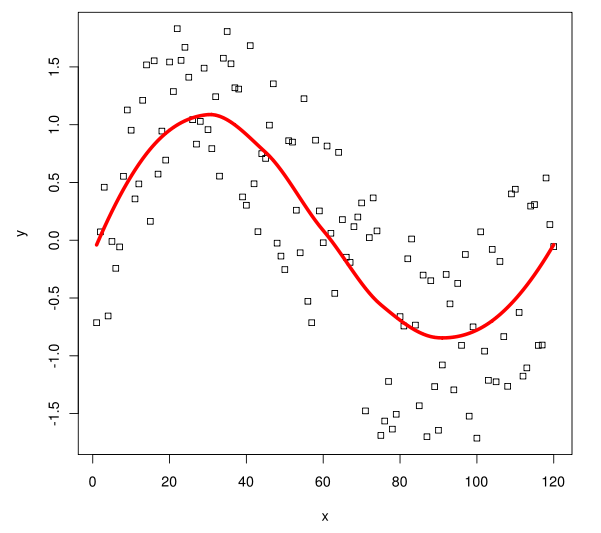

### What is Lowess Smoothing used for?

- Fitting a line to a scatter plot or time plot where noisy data values, sparse data points or weak interrelationships interfere with your ability to see a line of best fit.
- Linear regression where least squares fitting doesn’t create a line of good fit or is too labor-intensive to use.
- Data exploration and analysis in the social sciences (ex. particularly in elections and voting behavior.)

### Video Explanation of LOESS smoothing. 
https://www.youtube.com/watch?v=Vf7oJ6z2LCc

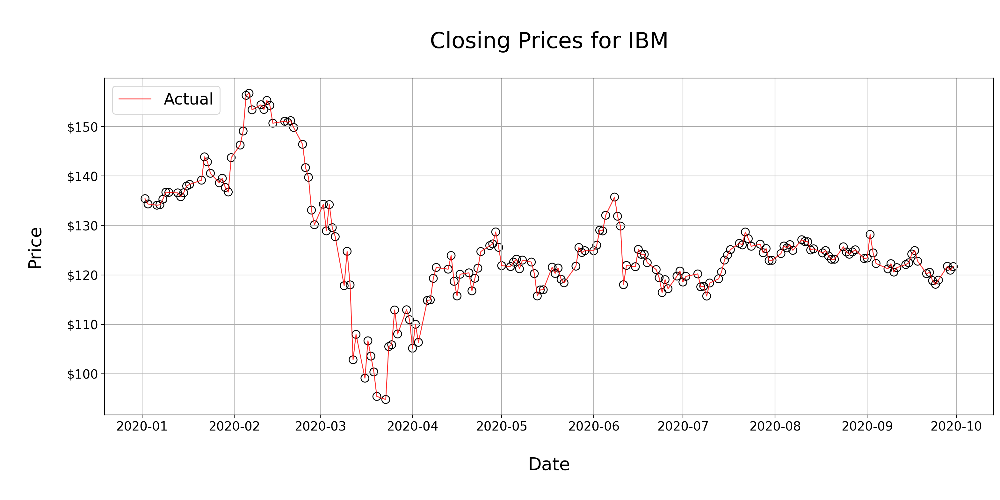

In [26]:
company = 'IBM'
source = 'yahoo'

start=dt.datetime(2020, 1, 1)
end=dt.datetime(2020, 9, 30)

closing_prices = data.DataReader(company, source, start, end)['Close']
dates = closing_prices.index

plt.style.context('ggplot')
fig, ax = plt.subplots(figsize = (18,7), dpi = 200)

fmt = '${x:,.0f}'
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick) 
ax.tick_params(axis='y', labelsize = 14)
ax.tick_params(axis='x', labelsize = 14)

ax.set_title('\nClosing Prices for {}\n'.format(company), fontsize = 25)
ax.set_xlabel('\nDate\n', fontsize = 20)
ax.set_ylabel('\nPrice\n', fontsize = 20)

ax.scatter(dates, closing_prices, facecolors='none', edgecolors='black', linewidth = 1, s = 80)
ax.plot(dates, closing_prices, color = 'red', linewidth = 1, alpha = 0.8, label = 'Actual')

ax.grid(which = 'major')
plt.legend(loc = 2, fontsize = 18)
plt.show()

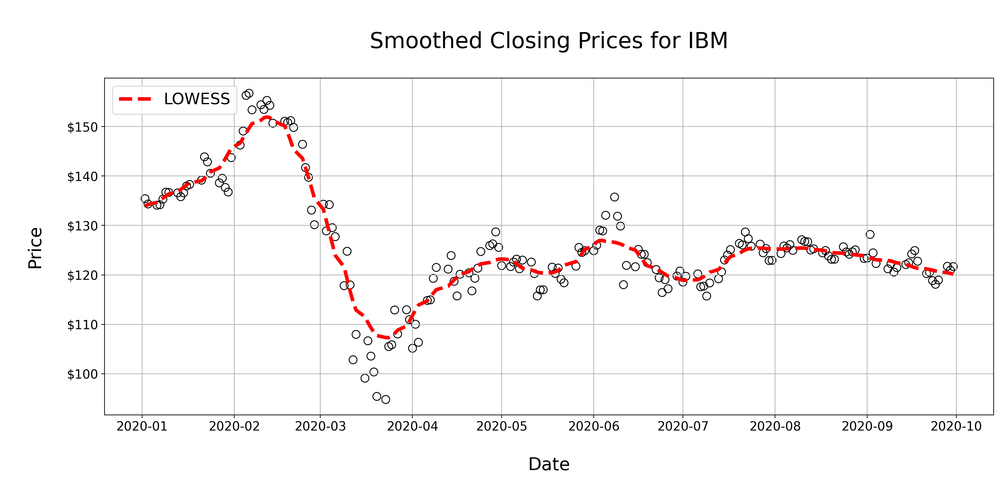

In [27]:
smoothed_prices = smooth_lowess(closing_prices, lowess_window_length = 21)

company = 'IBM'
source = 'yahoo'

start=dt.datetime(2020, 1, 1)
end=dt.datetime(2020, 9, 30)

closing_prices = data.DataReader(company, source, start, end)['Close']
dates = closing_prices.index

plt.style.context('ggplot')
fig, ax = plt.subplots(figsize = (18,7), dpi = 200)

fmt = '${x:,.0f}'
tick = ticker.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick) 
ax.tick_params(axis='y', labelsize = 14)
ax.tick_params(axis='x', labelsize = 14)

ax.set_title('\nSmoothed Closing Prices for {}\n'.format(company), fontsize = 25)
ax.set_xlabel('\nDate\n', fontsize = 20)
ax.set_ylabel('\nPrice\n', fontsize = 20)

ax.scatter(dates, closing_prices, facecolors='none', edgecolors='black', linewidth = 1, s = 80)
ax.plot(dates, smoothed_prices, color = 'red', linestyle = '--', linewidth = 4, label = 'LOWESS')

ax.grid(which = 'major')
plt.legend(loc = 2, fontsize = 18)
plt.show()

## Undersmoothed, Oversmoothed, Smoothed About Right

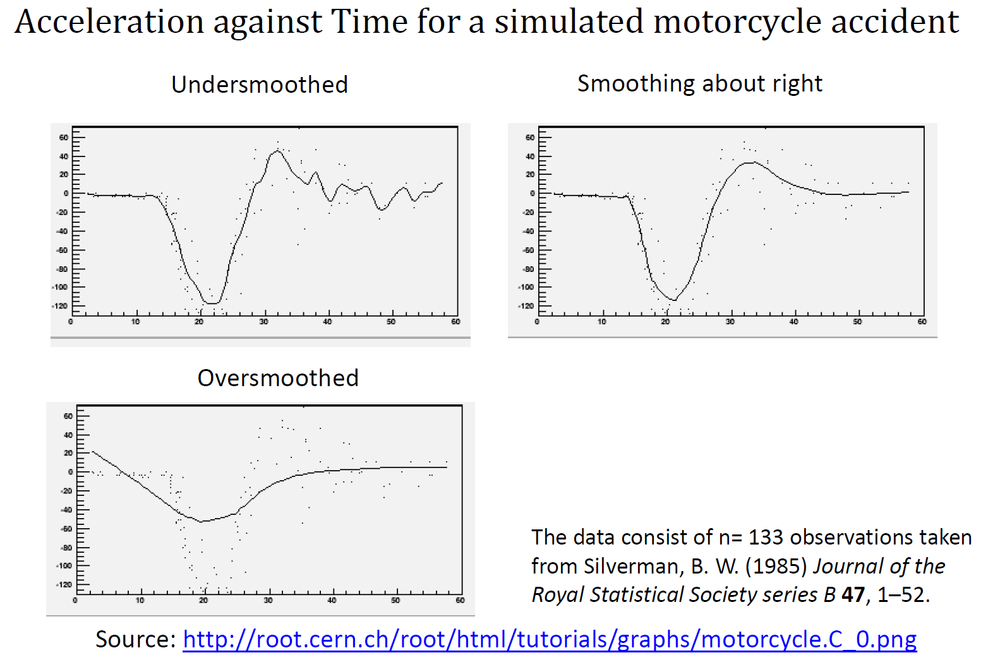

# Generate Example Data

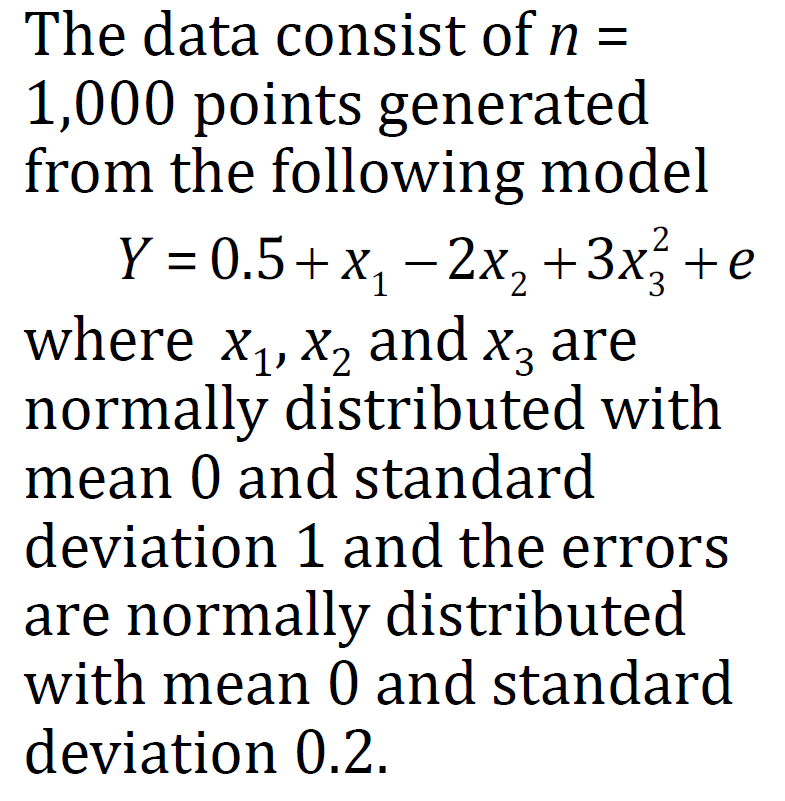

### Feature Columns

In [28]:
num_samples = 1000
desired_mean = 0
desired_std_dev = 1

x1 = np.random.normal(loc=desired_mean, scale=desired_std_dev, size=num_samples)
x2 = np.random.normal(loc=desired_mean, scale=desired_std_dev, size=num_samples)
x3 = np.random.normal(loc=desired_mean, scale=desired_std_dev, size=num_samples)

### Error

In [29]:
num_samples = 1000
desired_mean = 0
desired_std_dev = 0.2

e = np.random.normal(loc=desired_mean, scale=desired_std_dev, size=num_samples)

### Coefficients

In [30]:
b1 = 1
b2 = -2
b3 = 3
intercept = 0.5

### Target Variable 


In [31]:
y = b1*x1 + b2+x2 + b3*x3**2 + e

### Make Dataframe

In [32]:
df = pd.DataFrame({'y':y,'x1':x1,'x2':x2,'x3':x3})
df.head()

,y,x1,x2,x3
0,-1.864384,-0.916544,-0.862611,-0.734680
1,-1.317173,-0.247069,0.527839,0.262403
2,-1.364584,0.907281,-0.289619,-0.071230
3,-0.547700,0.172699,0.602254,-0.441073
4,0.396331,-1.841740,-0.457402,-1.211110


### Scatterplot Matrix

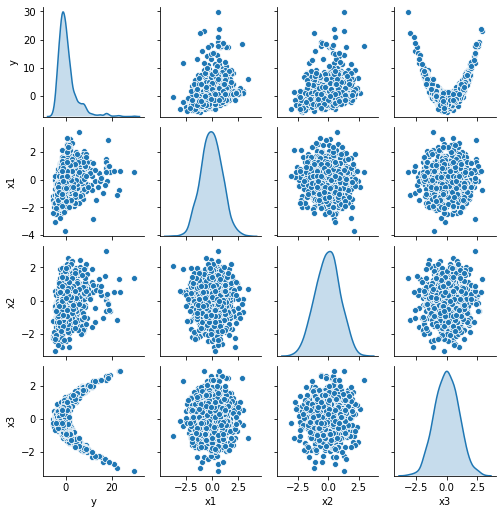

In [33]:
sns.pairplot(df, diag_kind="kde", corner=False, height = 1.75)
plt.show()

### Assign Predictor Variables (X) and make a Correlation Matrix

,x1,x2,x3
x1,1.000000,-0.043294,0.034725
x2,-0.043294,1.000000,0.009706
x3,0.034725,0.009706,1.000000


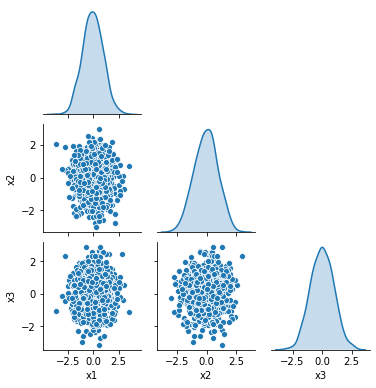

In [34]:
X = df[['x1', 'x2','x3']]
display(X.corr())
sns.pairplot(X, diag_kind="kde", corner=True, height = 1.75)
plt.show()

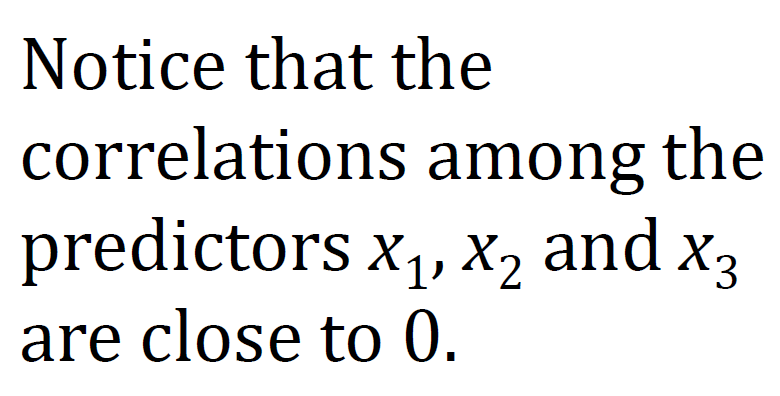

# Fit the Model 

In [35]:
results, fitted_ols_model = ols_regression(
    y,
    X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=False,
    display_leverage_plots=False,
    display_marginal_model_plots=False,
    return_data=True
)

,,
0,RSquare,0.140499
1,RSquare Adj,0.13791
2,Root Mean Square Error,7.594475
3,Mean of Response,0.73719
4,Observations (or Sum Wgts),1000


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,3,2482.881,2482.881,54.2708
1,Error,996,15189.0,15189.0,Prob > F
2,C.Total,999,17672.31,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,0.84702,0.12382,6.84,<.0001*,0.76347,0.93057,.
1,x1,1.11785,0.1226,9.12,<.0001*,1.03513,1.20057,1.0029*
2,x2,1.15142,0.12505,9.21,<.0001*,1.06704,1.23579,1.0018*
3,x3,0.12407,0.12724,0.98,0.3297,0.03822,0.20992,1.0013*


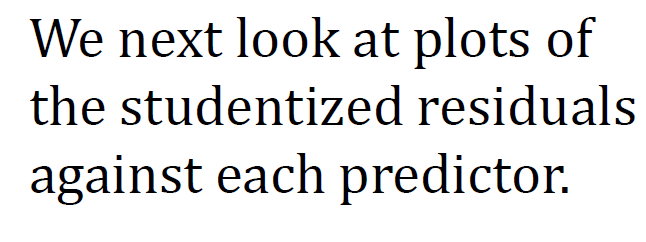

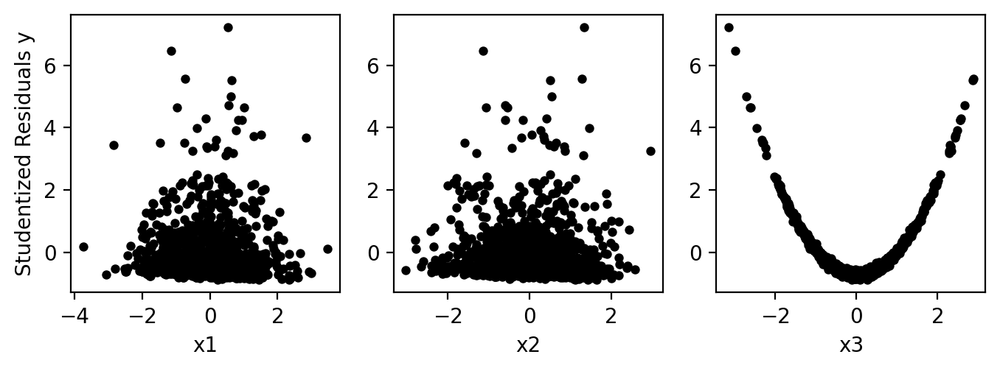

In [36]:
fig = plt.figure(figsize = (8,2.5), dpi=200)

ax1 = plt.subplot2grid((1, 3), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1, 3), (0, 1), rowspan=1, colspan=1)
ax3 = plt.subplot2grid((1, 3), (0, 2), rowspan=1, colspan=1)

ax1.scatter(df.x1, results.studentized_residuals, c = 'black', s = 12)
ax1.set_ylabel('Studentized Residuals y')
ax1.set_xlabel('x1')

ax2.scatter(df.x2, results.studentized_residuals, c = 'black', s = 12)
ax2.set_xlabel('x2')

ax3.scatter(df.x3, results.studentized_residuals, c = 'black', s = 12)
ax3.set_xlabel('x3')

plt.show()


# What is a Marginal Model Plot?

A given predictor’s marginal model plot shows two curves on the same set of axes:
- 1. a locally smoothed curve of Y vs the predictor, and
- 2. a locally smoothed curve of the predicted values of Y vs the predictor.
    


If the model is correctly specified in that predictor, then these two curves should be the same shape.


In [37]:
y = results['y']
yhat = results['yhat']
x = df.x3
data = pd.DataFrame({'x':df.x3,'y':y,'yhat':yhat}).sort_values('x').reset_index().drop(columns = 'index')

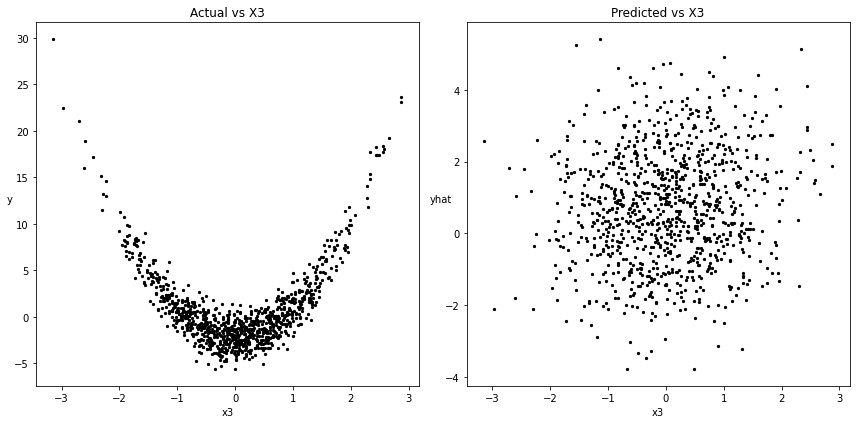

In [38]:
fig = plt.figure(figsize = (12,6))

ax1 = plt.subplot2grid((1, 2), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1, 2), (0, 1), rowspan=1, colspan=1)

ax1.scatter(data['x'], data['y'], c = 'black', s = 5)
ax1.set_ylabel('y', rotation = 0)
ax1.set_xlabel('x3')
ax1.set_title('Actual vs X3')

ax2.scatter(data['x'], data['yhat'], c = 'black', s = 5)
ax2.set_ylabel('yhat', rotation = 0)
ax2.set_xlabel('x3')
ax2.set_title('Predicted vs X3')


plt.tight_layout()
plt.show()

In [39]:
# y = results['y']
# yhat = results['yhat']
# x = df.x3
# data = pd.DataFrame({'x':df.x3,'y':y,'yhat':yhat}).sort_values('x').reset_index().drop(columns = 'index')

# data['y_smooth'] =  smooth_lowess(data['y'], lowess_window_length = 100, smoothing_iterations = 5)
# data['yhat_smooth'] =  smooth_lowess(data['yhat'], lowess_window_length = 100, smoothing_iterations = 5)
# data['x_smooth'] = smooth_lowess(data['x'], lowess_window_length = 100, smoothing_iterations = 5)
# data

In [40]:
#data = pd.DataFrame({'x':df.x3,'y':y,'yhat':yhat}).sort_values('x').reset_index().drop(columns = 'index')

data['y_smooth'] =  smooth_lowess(data['y'], lowess_window_length = 100, smoothing_iterations = 5)
data['yhat_smooth'] =  smooth_lowess(data['yhat'], lowess_window_length = 100, smoothing_iterations = 5)
data['x_smooth'] = smooth_lowess(data['x'], lowess_window_length = 100, smoothing_iterations = 5)
data

,x,y,yhat,y_smooth,yhat_smooth,x_smooth
0,-3.144026,29.884466,2.582748,10.895089,0.410896,-2.057399
1,-2.978101,22.471205,-2.103466,10.789261,0.416466,-2.048354
2,-2.707915,21.029222,1.824087,10.683639,0.421990,-2.039310
3,-2.613958,16.055049,-1.799763,10.578228,0.427465,-2.030268
4,-2.593950,18.866593,1.033550,10.473032,0.432887,-2.021226
...,...,...,...,...,...,...
995,2.560817,17.716808,1.390650,13.978195,1.699923,1.910595
996,2.568692,18.085320,1.497608,14.160700,1.713463,1.918260
997,2.655390,19.223095,1.099965,14.343981,1.727122,1.925927
998,2.864404,23.630354,2.494347,14.528023,1.740900,1.933597


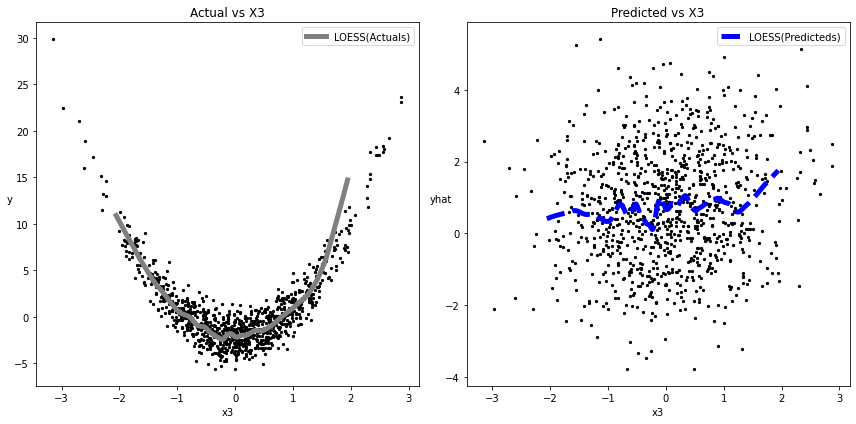

In [41]:
fig = plt.figure(figsize = (12,6))

ax1 = plt.subplot2grid((1, 2), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1, 2), (0, 1), rowspan=1, colspan=1)

ax1.scatter(data['x'], data['y'], c = 'black', s = 5)
ax1.plot(data['x_smooth'], data['y_smooth'], c = 'grey', linewidth = 5, label = 'LOESS(Actuals)')
ax1.set_ylabel('y', rotation = 0)
ax1.set_xlabel('x3')
ax1.set_title('Actual vs X3')
ax1.legend()

ax2.scatter(data['x'], data['yhat'], c = 'black', s = 5)
ax2.plot(data['x_smooth'], data['yhat_smooth'], c = 'blue', linewidth = 5, linestyle = '--', label = 'LOESS(Predicteds)')
ax2.set_ylabel('yhat', rotation = 0)
ax2.set_xlabel('x3')
ax2.set_title('Predicted vs X3')
ax2.legend()

plt.tight_layout()
plt.show()

# Combine the Actual and Predicted Graphs into a Marginal Model Plot


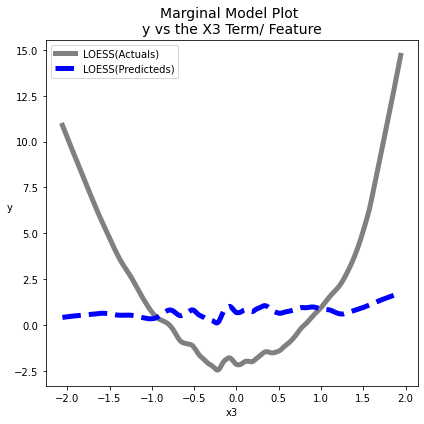

In [42]:
fig = plt.figure(figsize = (6,6))

ax1 = plt.subplot2grid((1, 1), (0, 0), rowspan=1, colspan=1)

ax1.plot(data['x_smooth'], data['y_smooth'], c = 'grey', linewidth = 5, label = 'LOESS(Actuals)')
ax1.plot(data['x_smooth'], data['yhat_smooth'], c = 'blue', linewidth = 5, linestyle = '--', label = 'LOESS(Predicteds)')
ax1.set_ylabel('y', rotation = 0)
ax1.set_xlabel('x3')
ax1.set_title('Marginal Model Plot \ny vs the X3 Term/ Feature', fontsize = 14)
ax1.legend()

plt.tight_layout()
plt.show()

,,
0,RSquare,0.140499
1,RSquare Adj,0.13791
2,Root Mean Square Error,7.594475
3,Mean of Response,0.73719
4,Observations (or Sum Wgts),1000


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,3,2482.881,2482.881,54.2708
1,Error,996,15189.0,15189.0,Prob > F
2,C.Total,999,17672.31,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,0.84702,0.12382,6.84,<.0001*,0.76347,0.93057,.
1,x1,1.11785,0.1226,9.12,<.0001*,1.03513,1.20057,1.0029*
2,x2,1.15142,0.12505,9.21,<.0001*,1.06704,1.23579,1.0018*
3,x3,0.12407,0.12724,0.98,0.3297,0.03822,0.20992,1.0013*


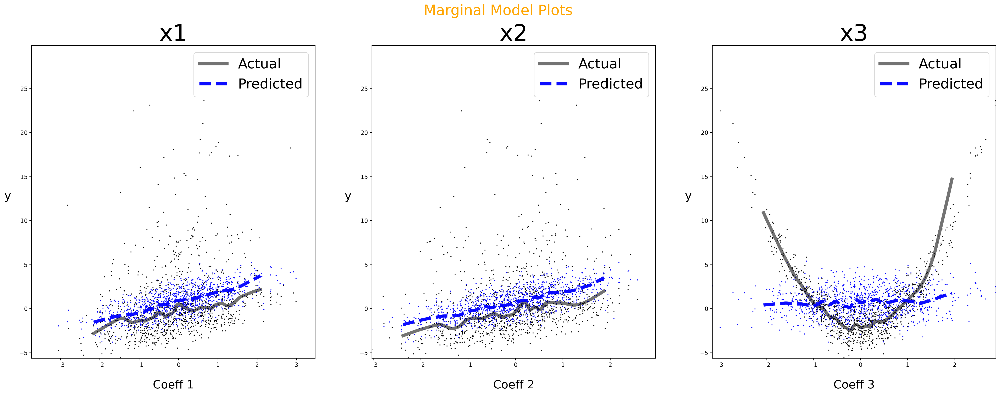

In [43]:
results, fitted_ols_model = ols_regression(
    y,
    X = X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=False,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

### Conclusion:  We can see from the Marginal Model Plots that the model needs to include a quadratic term

In [44]:
X['x3*x3'] = X['x3']*X['x3']
X

,x1,x2,x3,x3*x3
0,-0.916544,-0.862611,-0.734680,0.539755
1,-0.247069,0.527839,0.262403,0.068855
2,0.907281,-0.289619,-0.071230,0.005074
3,0.172699,0.602254,-0.441073,0.194546
4,-1.841740,-0.457402,-1.211110,1.466788
...,...,...,...,...
995,-2.065743,-0.634874,-0.245116,0.060082
996,-1.062779,0.863576,-0.276731,0.076580
997,-1.937987,1.414827,0.531067,0.282032
998,0.257432,-0.572027,0.976307,0.953175


,,
0,RSquare,0.997618
1,RSquare Adj,0.997608
2,Root Mean Square Error,0.021051
3,Mean of Response,0.73719
4,Observations (or Sum Wgts),1000


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,4,17629.728,17629.728,104162.4029
1,Error,995,41.79,41.79,Prob > F
2,C.Total,999,17672.31,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,-1.99295,0.00807,-247.06,<.0001*,-1.9984,-1.98751,.
1,x1,0.9986,0.00646,154.56,<.0001*,0.99424,1.00296,1.0029*
2,x2,1.00427,0.00659,152.36,<.0001*,0.99982,1.00872,1.0018*
3,x3,-0.00153,0.00671,-0.23,0.8192,-0.00606,0.00299,1.0025*
4,x3*x3,2.99805,0.00501,598.31,<.0001*,2.99467,3.00143,1.0012*


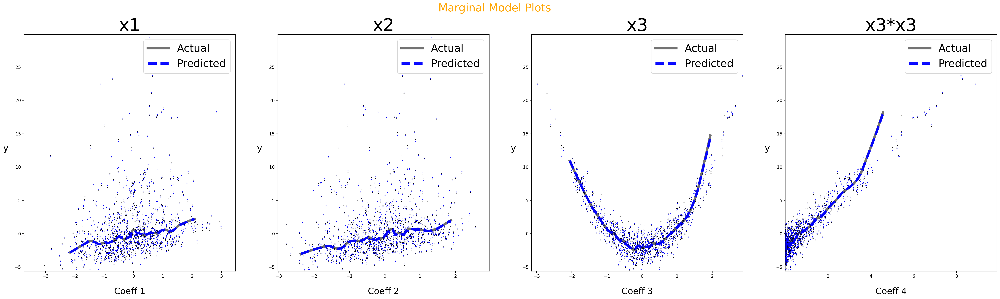

In [45]:
results, fitted_ols_model = ols_regression(
    y,
    X = X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=False,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

In [46]:
X['x1*x1'] = X['x1']*X['x1']
X

,x1,x2,x3,x3*x3,x1*x1
0,-0.916544,-0.862611,-0.734680,0.539755,0.840053
1,-0.247069,0.527839,0.262403,0.068855,0.061043
2,0.907281,-0.289619,-0.071230,0.005074,0.823160
3,0.172699,0.602254,-0.441073,0.194546,0.029825
4,-1.841740,-0.457402,-1.211110,1.466788,3.392005
...,...,...,...,...,...
995,-2.065743,-0.634874,-0.245116,0.060082,4.267294
996,-1.062779,0.863576,-0.276731,0.076580,1.129500
997,-1.937987,1.414827,0.531067,0.282032,3.755793
998,0.257432,-0.572027,0.976307,0.953175,0.066271


,,
0,RSquare,0.99762
1,RSquare Adj,0.997608
2,Root Mean Square Error,0.021033
3,Mean of Response,0.73719
4,Observations (or Sum Wgts),1000


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,5,17629.76,17629.76,83315.0789
1,Error,994,41.748,41.748,Prob > F
2,C.Total,999,17672.31,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,-1.98871,0.00933,-213.2,<.0001*,-1.995,-1.98242,.
1,x1,0.99843,0.00646,154.45,<.0001*,0.99406,1.00279,1.0058*
2,x2,1.00441,0.00659,152.33,<.0001*,0.99996,1.00886,1.002*
3,x3,-0.00156,0.00671,-0.23,0.8164,-0.00608,0.00297,1.0025*
4,x3*x3,2.99794,0.00501,598.05,<.0001*,2.99456,3.00132,1.1163*
5,x1*x1,-0.00406,0.00448,-0.91,0.3652,-0.00708,-0.00104,1.1181*


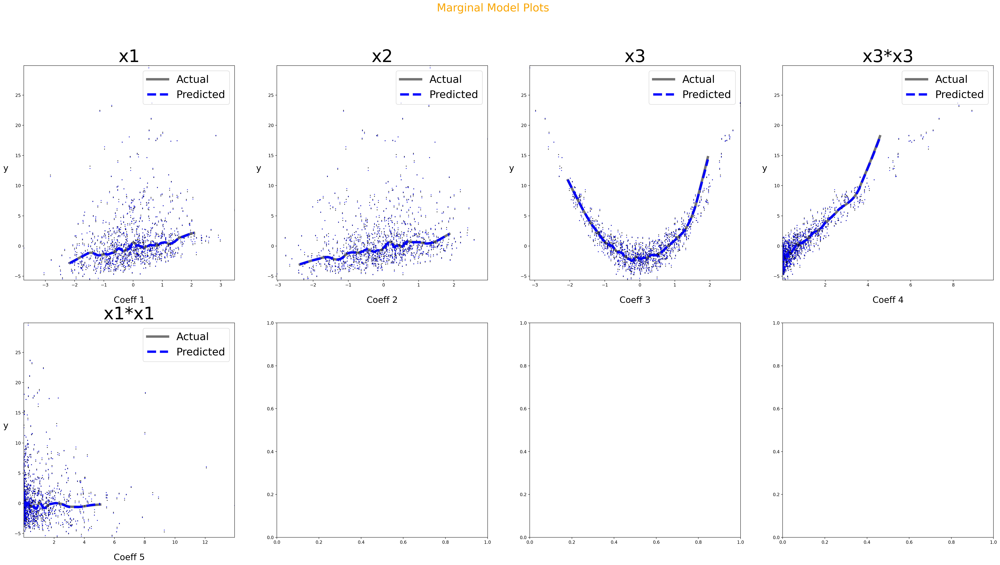

In [47]:
results, fitted_ols_model = ols_regression(
    y,
    X = X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=False,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

In [48]:
X = X.drop(columns = ['x3', 'x1*x1'])
X

,x1,x2,x3*x3
0,-0.916544,-0.862611,0.539755
1,-0.247069,0.527839,0.068855
2,0.907281,-0.289619,0.005074
3,0.172699,0.602254,0.194546
4,-1.841740,-0.457402,1.466788
...,...,...,...
995,-2.065743,-0.634874,0.060082
996,-1.062779,0.863576,0.076580
997,-1.937987,1.414827,0.282032
998,0.257432,-0.572027,0.953175


,,
0,RSquare,0.997617
1,RSquare Adj,0.99761
2,Root Mean Square Error,0.021052
3,Mean of Response,0.73719
4,Observations (or Sum Wgts),1000


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,3,17629.725,17629.725,139015.4634
1,Error,996,41.832,41.832,Prob > F
2,C.Total,999,17672.31,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,-1.99294,0.00806,-247.18,<.0001*,-1.99838,-1.9875,.
1,x1,0.99855,0.00645,154.72,<.0001*,0.99419,1.0029,1.0017*
2,x2,1.00425,0.00659,152.44,<.0001*,0.99981,1.0087,1.0017*
3,x3*x3,2.99802,0.00501,598.88,<.0001*,2.99464,3.00139,1.0*


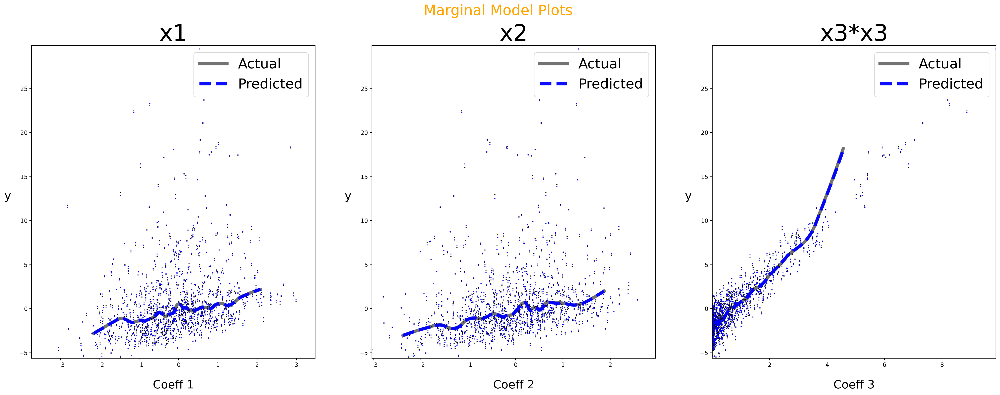

In [49]:
results, fitted_ols_model = ols_regression(
    y,
    X = X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=False,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

In [50]:
X['x1*x1'] = X['x1']*X['x1']
X['x3'] = X['x3*x3']**0.5
X = X.drop(columns = 'x3*x3')
X

,x1,x2,x1*x1,x3
0,-0.916544,-0.862611,0.840053,0.734680
1,-0.247069,0.527839,0.061043,0.262403
2,0.907281,-0.289619,0.823160,0.071230
3,0.172699,0.602254,0.029825,0.441073
4,-1.841740,-0.457402,3.392005,1.211110
...,...,...,...,...
995,-2.065743,-0.634874,4.267294,0.245116
996,-1.062779,0.863576,1.129500,0.276731
997,-1.937987,1.414827,3.755793,0.531067
998,0.257432,-0.572027,0.066271,0.976307


,,
0,RSquare,0.89296
1,RSquare Adj,0.89253
2,Root Mean Square Error,0.945796
3,Mean of Response,0.73719
4,Observations (or Sum Wgts),1000


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,4,15780.236,15780.236,2075.1482
1,Error,995,1891.495,1891.495,Prob > F
2,C.Total,999,17672.31,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,-4.03021,0.07968,-50.58,<.0001*,-4.08397,-3.97644,.
1,x1,1.06237,0.04328,24.54,<.0001*,1.03317,1.09158,1.0044*
2,x2,1.03145,0.04418,23.34,<.0001*,1.00164,1.06126,1.0023*
3,x1*x1,-0.03788,0.03,-1.26,0.2071,-0.05812,-0.01763,1.2629*
4,x3,6.29753,0.07529,83.65,<.0001*,6.24673,6.34833,1.261*


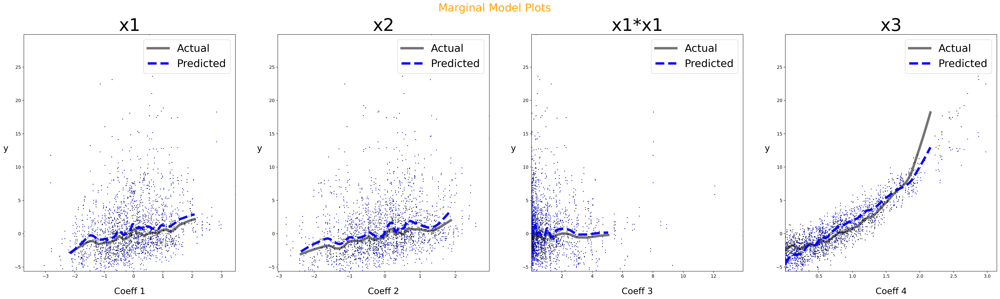

In [51]:
results, fitted_ols_model = ols_regression(
    y,
    X = X,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=False,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

### Conclusion: Marginal model plots demonstrate that the model appears to be correctly specified.

# Exercise: Model Basketball Player Salaries

In [52]:
pd.options.display.max_rows = 100        #Increases the number of rows displayed without a break in the middle.
pd.options.display.max_columns = 100     #Increases the number of columns displayed without a break in the middle.
pd.set_option('max_colwidth',100)        #Increases the width of the columns to display 100 characters at the same time.

### Basketball Player Stats - 2013

In [53]:
player_stats_url = 'https://www.basketball-reference.com/leagues/NBA_2013_per_game.html'
stats = pd.read_html(player_stats_url)[0]
stats.head()

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1,Quincy Acy,PF,22,TOR,29,0,11.8,1.4,2.6,.560,0.0,0.1,.500,1.4,2.5,.562,.567,1.1,1.3,.816,1.0,1.6,2.7,0.4,0.4,0.5,0.6,1.8,4.0
1,2,Jeff Adrien,PF,26,CHA,52,5,13.7,1.4,3.2,.429,0.0,0.0,.000,1.4,3.2,.434,.429,1.3,1.9,.650,1.3,2.5,3.8,0.7,0.3,0.5,0.6,1.5,4.0
2,3,Arron Afflalo,SF,27,ORL,64,64,36.0,6.2,14.1,.439,1.1,3.8,.300,5.1,10.4,.489,.478,3.0,3.5,.857,0.5,3.3,3.7,3.2,0.6,0.2,2.2,2.1,16.5
3,4,Josh Akognon,PG,26,DAL,3,0,3.0,0.7,1.3,.500,0.3,0.7,.500,0.3,0.7,.500,.625,0.0,0.0,NaN,0.0,0.3,0.3,0.3,0.0,0.0,0.0,1.0,1.7
4,5,Cole Aldrich,C,24,TOT,45,0,8.6,1.0,1.8,.550,0.0,0.0,NaN,1.0,1.8,.550,.550,0.3,0.4,.600,0.7,2.0,2.7,0.2,0.1,0.5,0.5,1.3,2.2


In [54]:
stats = stats.fillna(0)
stats = stats.loc[stats['Rk']!= 'Rk']
stats['Player'] = stats['Player'].apply(lambda x: x.replace('*',''))
stats.head()

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,1,Quincy Acy,PF,22,TOR,29,0,11.8,1.4,2.6,.560,0.0,0.1,.500,1.4,2.5,.562,.567,1.1,1.3,.816,1.0,1.6,2.7,0.4,0.4,0.5,0.6,1.8,4.0
1,2,Jeff Adrien,PF,26,CHA,52,5,13.7,1.4,3.2,.429,0.0,0.0,.000,1.4,3.2,.434,.429,1.3,1.9,.650,1.3,2.5,3.8,0.7,0.3,0.5,0.6,1.5,4.0
2,3,Arron Afflalo,SF,27,ORL,64,64,36.0,6.2,14.1,.439,1.1,3.8,.300,5.1,10.4,.489,.478,3.0,3.5,.857,0.5,3.3,3.7,3.2,0.6,0.2,2.2,2.1,16.5
3,4,Josh Akognon,PG,26,DAL,3,0,3.0,0.7,1.3,.500,0.3,0.7,.500,0.3,0.7,.500,.625,0.0,0.0,0,0.0,0.3,0.3,0.3,0.0,0.0,0.0,1.0,1.7
4,5,Cole Aldrich,C,24,TOT,45,0,8.6,1.0,1.8,.550,0.0,0.0,0,1.0,1.8,.550,.550,0.3,0.4,.600,0.7,2.0,2.7,0.2,0.1,0.5,0.5,1.3,2.2


### Rookie Players - 2013

In [55]:
rookie_url = 'https://www.basketball-reference.com/leagues/NBA_2013_rookies.html'
rookies = pd.read_html(rookie_url)[0]
rookies = rookies.iloc[:,1].dropna().to_list()
rookies = pd.DataFrame({'Player':rookies})
rookies['Rookie'] = 1
rookies.head()

,Player,Rookie
0,Quincy Acy,1
1,Josh Akognon,1
2,Harrison Barnes,1
3,Will Barton,1
4,Aron Baynes,1


### Basketball Player Salaries

In [56]:
salaries = pd.DataFrame()
for page_number in range(1,13):
    player_salaries_url = 'http://www.espn.com/nba/salaries/_/year/2013/page/{}/seasontype/1'.format(page_number)
    print(player_salaries_url)
    read_salaries = pd.read_html(player_salaries_url)[0]
    frames = [salaries, read_salaries]
    salaries = pd.concat(frames)
salaries.head(20)

http://www.espn.com/nba/salaries/_/year/2013/page/1/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/2/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/3/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/4/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/5/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/6/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/7/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/8/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/9/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/10/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/11/seasontype/1
http://www.espn.com/nba/salaries/_/year/2013/page/12/seasontype/1


,0,1,2,3
0,RK,NAME,TEAM,SALARY
1,1,"Kobe Bryant, SF",Los Angeles Lakers,"$30,453,805"
2,2,"Dirk Nowitzki, F",Dallas Mavericks,"$20,907,128"
3,3,"Amar'e Stoudemire, C",New York Knicks,"$19,948,799"
4,4,"Joe Johnson, G",Brooklyn Nets,"$19,752,645"
5,5,"Carmelo Anthony, PF",New York Knicks,"$19,444,503"
6,6,"Pau Gasol, PF",Los Angeles Lakers,"$19,285,850"
7,7,"Chris Bosh, PF",Miami Heat,"$19,067,500"
8,8,"LeBron James, SF",Miami Heat,"$19,067,500"
9,9,"Dwyane Wade, G",Miami Heat,"$18,673,000"


In [57]:
salaries = salaries.loc[salaries[0]!='RK'].fillna(0)
salaries[3] = salaries[3].apply(lambda x: x.replace('$',''))
salaries[3] = salaries[3].apply(lambda x: x.replace(',',''))
salaries[1] = salaries[1].apply(lambda x: x.split(',',1)[0])
salaries = salaries.drop(columns = [0,2])
salaries.head(20)

,1,3
1,Kobe Bryant,30453805
2,Dirk Nowitzki,20907128
3,Amar'e Stoudemire,19948799
4,Joe Johnson,19752645
5,Carmelo Anthony,19444503
6,Pau Gasol,19285850
7,Chris Bosh,19067500
8,LeBron James,19067500
9,Dwyane Wade,18673000
10,Chris Paul,18668431


### Merge the datasets

In [58]:
data = salaries.merge(rookies, how = 'left', left_on = 1, right_on = 'Player')
data = data.fillna(0).drop(columns = ['Player'])
data 

,1,3,Rookie
0,Kobe Bryant,30453805,0.0
1,Dirk Nowitzki,20907128,0.0
2,Amar'e Stoudemire,19948799,0.0
3,Joe Johnson,19752645,0.0
4,Carmelo Anthony,19444503,0.0
...,...,...,...
475,Damien Wilkins,854389,0.0
476,Joe Alexander,854389,0.0
477,Jason Kapono,854389,0.0
478,T.J. Ford,854389,0.0


In [59]:
data = data.merge(stats, how = 'left', left_on = 1, right_on = 'Player').dropna()
data = data.drop(columns = [1, 'Rk'])
data = data.rename(columns = {3:'Salary'})
data.head(20)

,Salary,Rookie,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
0,30453805,0.0,Kobe Bryant,SG,34,LAL,78,78,38.6,9.5,20.4,.463,1.7,5.2,.324,7.8,15.2,.510,.504,6.7,8.0,.839,0.8,4.7,5.6,6.0,1.4,0.3,3.7,2.2,27.3
1,20907128,0.0,Dirk Nowitzki,PF,34,DAL,53,47,31.3,6.5,13.7,.471,1.2,3.0,.414,5.2,10.8,.487,.516,3.1,3.6,.860,0.7,6.2,6.8,2.5,0.7,0.7,1.3,1.8,17.3
2,19948799,0.0,Amar'e Stoudemire,PF,30,NYK,29,0,23.5,5.3,9.2,.577,0.0,0.0,0,5.3,9.2,.577,.577,3.6,4.5,.808,2.1,2.9,5.0,0.4,0.3,0.7,1.7,3.1,14.2
3,19752645,0.0,Joe Johnson,SG,31,BRK,72,72,36.7,6.2,14.6,.423,2.1,5.5,.375,4.1,9.1,.452,.493,1.8,2.2,.820,0.7,2.3,3.0,3.5,0.7,0.2,1.7,1.4,16.3
4,19444503,0.0,Carmelo Anthony,PF,28,NYK,67,67,37.0,10.0,22.2,.449,2.3,6.2,.379,7.6,16.0,.476,.502,6.3,7.6,.830,2.0,4.9,6.9,2.6,0.8,0.5,2.6,3.1,28.7
5,19285850,0.0,Pau Gasol,PF,32,LAL,49,42,33.8,5.5,11.8,.466,0.2,0.6,.286,5.3,11.2,.475,.473,2.6,3.6,.702,2.3,6.3,8.6,4.1,0.5,1.2,2.1,1.9,13.7
6,19067500,0.0,Chris Bosh,C,28,MIA,74,74,33.2,6.6,12.3,.535,0.3,1.0,.284,6.3,11.3,.557,.546,3.3,4.1,.798,1.8,5.0,6.8,1.7,0.9,1.4,1.7,2.3,16.6
7,19067500,0.0,LeBron James,PF,28,MIA,76,76,37.9,10.1,17.8,.565,1.4,3.3,.406,8.7,14.5,.602,.603,5.3,7.0,.753,1.3,6.8,8.0,7.3,1.7,0.9,3.0,1.4,26.8
8,18673000,0.0,Dwyane Wade,SG,31,MIA,69,69,34.7,8.2,15.8,.521,0.2,1.0,.258,8.0,14.9,.537,.528,4.5,6.2,.725,1.2,3.7,5.0,5.1,1.9,0.8,2.8,2.0,21.2
9,18668431,0.0,Chris Paul,PG,27,LAC,70,70,33.4,5.9,12.2,.481,1.1,3.3,.328,4.8,8.9,.538,.526,4.1,4.6,.885,0.8,3.0,3.7,9.7,2.4,0.1,2.3,2.0,16.9


### Get dummies

In [60]:
df = data.copy()
df = df.drop(columns = ['Pos','Tm'])
for col in df.columns:
    if col != 'Player':
        df[col] = pd.to_numeric(df[col])
        
df = df.groupby('Player').mean()
df

,Salary,Rookie,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Player,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A.J. Price,854389.0,0.0,26.0,57.000000,22.000000,22.4,2.8,7.200000,0.390000,1.200000,3.5,0.350000,1.600000,3.7,0.427000,0.475,0.900000,1.1,0.790000,0.4,1.600000,2.000000,3.6,0.600000,0.100000,1.1,1.300000,7.7
Aaron Brooks,2400000.0,0.0,28.0,35.333333,13.333333,15.0,2.1,4.833333,0.406667,0.733333,2.1,0.345667,1.366667,2.7,0.453667,0.485,0.566667,0.7,0.512667,0.2,0.933333,1.166667,1.8,0.433333,0.266667,1.1,1.466667,5.5
Aaron Gray,2575000.0,0.0,28.0,42.000000,16.000000,12.2,1.1,2.100000,0.533000,0.000000,0.0,0.000000,1.100000,2.1,0.533000,0.533,0.500000,1.0,0.523000,1.1,2.000000,3.200000,0.8,0.200000,0.100000,0.9,2.000000,2.8
Al Harrington,7148600.0,0.0,32.0,10.000000,0.000000,11.9,2.0,5.700000,0.351000,0.800000,3.0,0.267000,1.200000,2.7,0.444000,0.421,0.300000,0.4,0.750000,0.6,2.100000,2.700000,1.0,0.400000,0.100000,0.7,1.800000,5.1
Al Horford,12000000.0,0.0,26.0,74.000000,74.000000,37.2,7.8,14.300000,0.543000,0.000000,0.1,0.500000,7.700000,14.2,0.544000,0.545,1.800000,2.8,0.644000,2.6,7.600000,10.200000,3.2,1.100000,1.100000,2.0,2.200000,17.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Willie Green,1399507.0,0.0,31.0,72.000000,60.000000,16.5,2.5,5.400000,0.461000,1.000000,2.3,0.428000,1.500000,3.1,0.486000,0.553,0.300000,0.4,0.719000,0.2,1.100000,1.300000,0.8,0.400000,0.200000,0.4,1.300000,6.3
Wilson Chandler,5930414.0,0.0,25.0,43.000000,8.000000,25.1,4.9,10.600000,0.462000,1.200000,2.9,0.413000,3.700000,7.7,0.480000,0.519,2.000000,2.6,0.793000,1.0,4.000000,5.100000,1.3,1.000000,0.300000,1.4,2.800000,13.0
Xavier Henry,2323200.0,0.0,21.0,50.000000,2.000000,12.5,1.3,3.200000,0.410000,0.100000,0.2,0.364000,1.200000,3.0,0.413000,0.422,1.200000,1.8,0.630000,0.4,1.400000,1.800000,0.3,0.300000,0.100000,0.6,1.400000,3.9


In [61]:
y = df['Salary']
X = df[[col for col in df.columns if col != 'Salary']]
X

,Rookie,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Player,,,,,,,,,,,,,,,,,,,,,,,,,,,
A.J. Price,0.0,26.0,57.000000,22.000000,22.4,2.8,7.200000,0.390000,1.200000,3.5,0.350000,1.600000,3.7,0.427000,0.475,0.900000,1.1,0.790000,0.4,1.600000,2.000000,3.6,0.600000,0.100000,1.1,1.300000,7.7
Aaron Brooks,0.0,28.0,35.333333,13.333333,15.0,2.1,4.833333,0.406667,0.733333,2.1,0.345667,1.366667,2.7,0.453667,0.485,0.566667,0.7,0.512667,0.2,0.933333,1.166667,1.8,0.433333,0.266667,1.1,1.466667,5.5
Aaron Gray,0.0,28.0,42.000000,16.000000,12.2,1.1,2.100000,0.533000,0.000000,0.0,0.000000,1.100000,2.1,0.533000,0.533,0.500000,1.0,0.523000,1.1,2.000000,3.200000,0.8,0.200000,0.100000,0.9,2.000000,2.8
Al Harrington,0.0,32.0,10.000000,0.000000,11.9,2.0,5.700000,0.351000,0.800000,3.0,0.267000,1.200000,2.7,0.444000,0.421,0.300000,0.4,0.750000,0.6,2.100000,2.700000,1.0,0.400000,0.100000,0.7,1.800000,5.1
Al Horford,0.0,26.0,74.000000,74.000000,37.2,7.8,14.300000,0.543000,0.000000,0.1,0.500000,7.700000,14.2,0.544000,0.545,1.800000,2.8,0.644000,2.6,7.600000,10.200000,3.2,1.100000,1.100000,2.0,2.200000,17.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Willie Green,0.0,31.0,72.000000,60.000000,16.5,2.5,5.400000,0.461000,1.000000,2.3,0.428000,1.500000,3.1,0.486000,0.553,0.300000,0.4,0.719000,0.2,1.100000,1.300000,0.8,0.400000,0.200000,0.4,1.300000,6.3
Wilson Chandler,0.0,25.0,43.000000,8.000000,25.1,4.9,10.600000,0.462000,1.200000,2.9,0.413000,3.700000,7.7,0.480000,0.519,2.000000,2.6,0.793000,1.0,4.000000,5.100000,1.3,1.000000,0.300000,1.4,2.800000,13.0
Xavier Henry,0.0,21.0,50.000000,2.000000,12.5,1.3,3.200000,0.410000,0.100000,0.2,0.364000,1.200000,3.0,0.413000,0.422,1.200000,1.8,0.630000,0.4,1.400000,1.800000,0.3,0.300000,0.100000,0.6,1.400000,3.9


# Train - Test Split

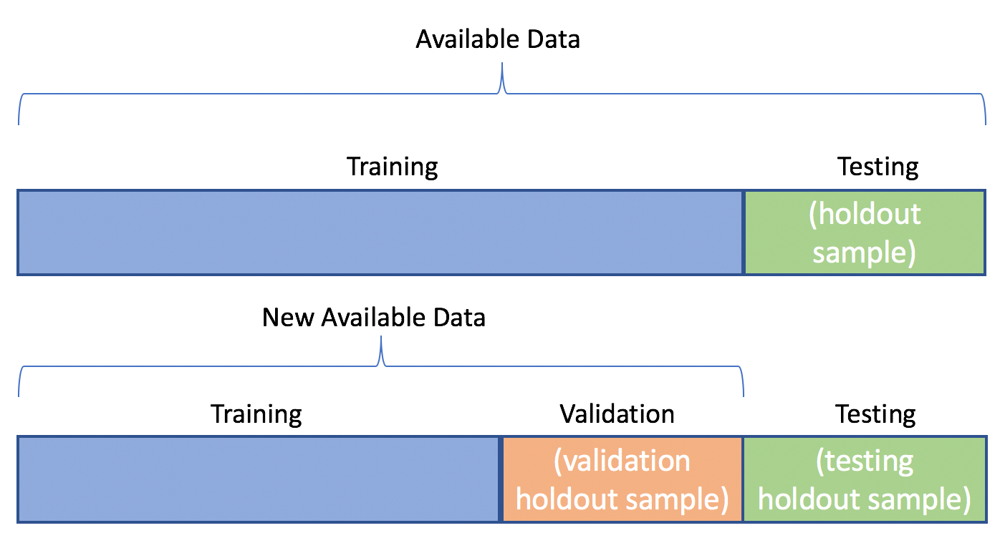

In [62]:
from sklearn.model_selection import train_test_split
X = np.log1p(X)
y = np.log1p(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.50, random_state=42)



,,
0,RSquare,0.620719
1,RSquare Adj,0.547046
2,Root Mean Square Error,0.155387
3,Mean of Response,15.08093
4,Observations (or Sum Wgts),167


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,27,84.942,84.942,8.4253
1,Error,139,51.847,51.847,Prob > F
2,C.Total,166,136.784,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,7.14983,1.66946,4.28,<.0001*,6.02084,8.27882,.
1,Rookie,0.20711,0.27335,0.76,0.4499,0.02225,0.39196,1.4309*
2,Age,1.78815,0.40953,4.37,<.0001*,1.5112,2.0651,257.8999
3,G,-0.23552,0.14401,-1.64,0.1042,-0.33291,-0.13813,149.6733
4,GS,0.00214,0.05038,0.04,0.9662,-0.03193,0.03621,10.3339
5,MP,0.83396,0.47696,1.75,0.0826,0.51141,1.15651,855.2402
6,FG,-3.55431,3.51678,-1.01,0.3139,-5.93256,-1.17605,12207.0495
7,FGA,3.27919,2.50617,1.31,0.1929,1.58437,4.97401,12650.5143
8,FG%,-9.79816,14.72782,-0.67,0.507,-19.75798,0.16166,13202.1809
9,3P,0.70347,1.12818,0.62,0.5339,-0.05947,1.46641,198.4594


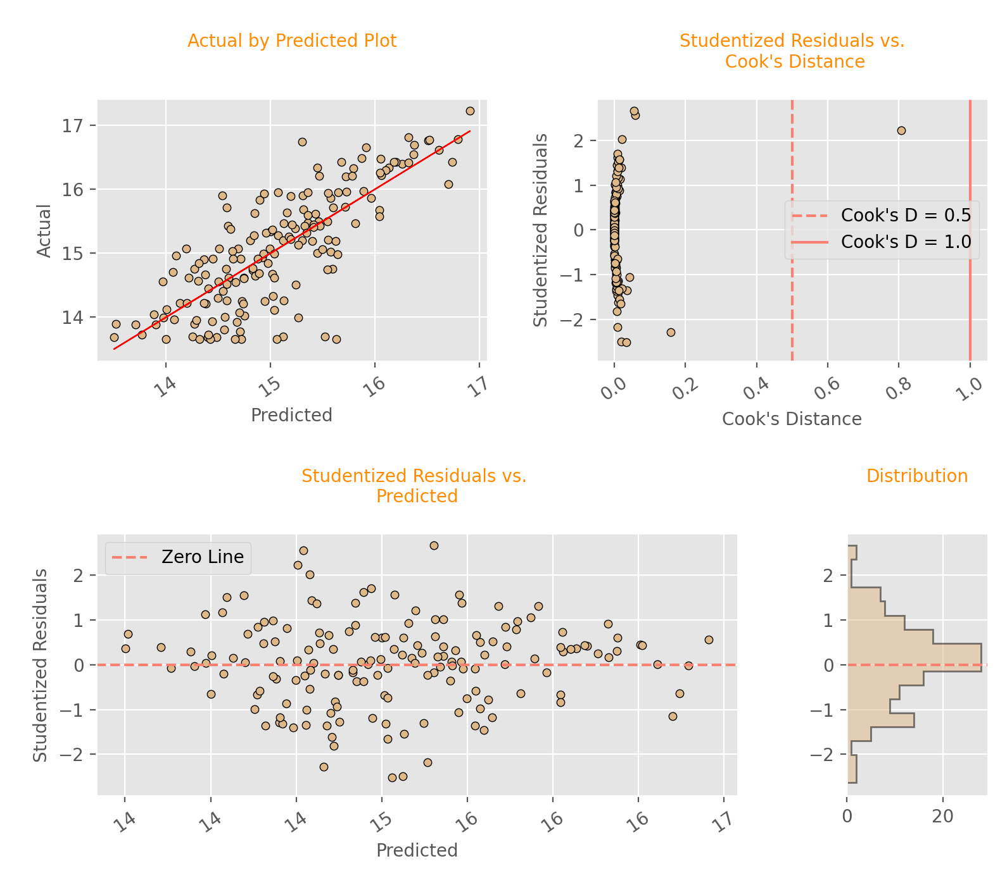

In [63]:
results, fitted_ols_model = ols_regression(
    y = y_train,
    X = X_train,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=False,
    return_data=True
)

In [64]:
vifs = get_vifs(X_train, add_intercept = False)
vifs = vifs[vifs < 10]
vifs

Rookie    1.430879
3P%       7.999480
BLK       8.317571
Name: VIF, dtype: float64

In [65]:
pvals = fitted_ols_model.pvalues[fitted_ols_model.pvalues<=0.05]
pvals


const    0.000034
Age      0.000025
TOV      0.041621
dtype: float64

In [66]:
X_train = X_train[['Rookie','3P%','BLK','Age','MP','FGA','2P','2PA']]
X_train

,Rookie,3P%,BLK,Age,MP,FGA,2P,2PA
Player,,,,,,,,
Jeremy Lamb,0.693147,0.262364,0.095310,3.044522,2.001480,1.386294,0.530628,0.993252
Randy Foye,0.000000,0.343590,0.262364,3.401197,3.346389,2.302585,0.875469,1.547563
Aaron Gray,0.000000,0.000000,0.095310,3.367296,2.580217,1.131402,0.741937,1.131402
Glen Davis,0.000000,0.000000,0.470004,3.332205,3.475067,2.714695,1.987874,2.708050
Marcus Thornton,0.000000,0.316270,0.095310,3.258097,3.218876,2.468100,1.308333,1.871802
...,...,...,...,...,...,...,...,...
Kevin Love,0.000000,0.196389,0.405465,3.218876,3.563883,2.867899,1.740466,2.517696
Daniel Orton,0.000000,0.000000,0.182322,3.135494,2.197225,1.098612,0.641854,1.098612
Eric Maynor,0.000000,0.302571,0.000000,3.258097,2.809403,1.710790,0.788457,1.394593


In [67]:
results, fitted_ols_model = ols_regression(
    y = y_train,
    X = X_train,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=False,
    display_leverage_plots=False,
    display_marginal_model_plots=False,
    return_data=True
)

,,
0,RSquare,0.530067
1,RSquare Adj,0.506272
2,Root Mean Square Error,0.192527
3,Mean of Response,15.08093
4,Observations (or Sum Wgts),167


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,8,72.536,72.536,22.2772
1,Error,158,64.306,64.306,Prob > F
2,C.Total,166,136.784,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,6.3859,1.34541,4.75,<.0001*,5.47634,7.29546,.
1,Rookie,0.20185,0.27523,0.73,0.4644,0.01578,0.38792,1.1533*
2,3P%,-0.09247,0.42545,-0.22,0.8282,-0.3801,0.19515,5.1821*
3,BLK,0.23715,0.208,1.14,0.256,0.09653,0.37777,4.0919*
4,Age,1.87708,0.37918,4.95,<.0001*,1.62074,2.13343,89.7431
5,MP,0.44133,0.27882,1.58,0.1155,0.25284,0.62982,293.9974
6,FGA,0.39793,0.34283,1.16,0.2475,0.16616,0.6297,217.7737
7,2P,1.27932,0.55755,2.29,0.0231*,0.90239,1.65625,233.1174
8,2PA,-0.76506,0.55439,-1.38,0.1695,-1.13986,-0.39027,451.1264


In [68]:
X_train = X_train.drop(columns = ['MP','FGA','2PA'])
X_train

,Rookie,3P%,BLK,Age,2P
Player,,,,,
Jeremy Lamb,0.693147,0.262364,0.095310,3.044522,0.530628
Randy Foye,0.000000,0.343590,0.262364,3.401197,0.875469
Aaron Gray,0.000000,0.000000,0.095310,3.367296,0.741937
Glen Davis,0.000000,0.000000,0.470004,3.332205,1.987874
Marcus Thornton,0.000000,0.316270,0.095310,3.258097,1.308333
...,...,...,...,...,...
Kevin Love,0.000000,0.196389,0.405465,3.218876,1.740466
Daniel Orton,0.000000,0.000000,0.182322,3.135494,0.641854
Eric Maynor,0.000000,0.302571,0.000000,3.258097,0.788457


,,
0,RSquare,0.498841
1,RSquare Adj,0.483277
2,Root Mean Square Error,0.20532
3,Mean of Response,15.08093
4,Observations (or Sum Wgts),167


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,5,68.26,68.26,32.051
1,Error,161,68.586,68.586,Prob > F
2,C.Total,166,136.784,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,7.10512,1.32106,5.38,<.0001*,6.21206,7.99818,.
1,Rookie,0.05697,0.27684,0.21,0.8372,-0.13018,0.24412,1.1049*
2,3P%,0.54324,0.36275,1.5,0.1362,0.29802,0.78847,3.5454*
3,BLK,0.24279,0.19676,1.23,0.219,0.10978,0.3758,3.4714*
4,Age,1.9282,0.38601,5.0,<.0001*,1.66725,2.18915,9.1154*
5,2P,1.10446,0.11351,9.73,<.0001*,1.02772,1.1812,9.1051*


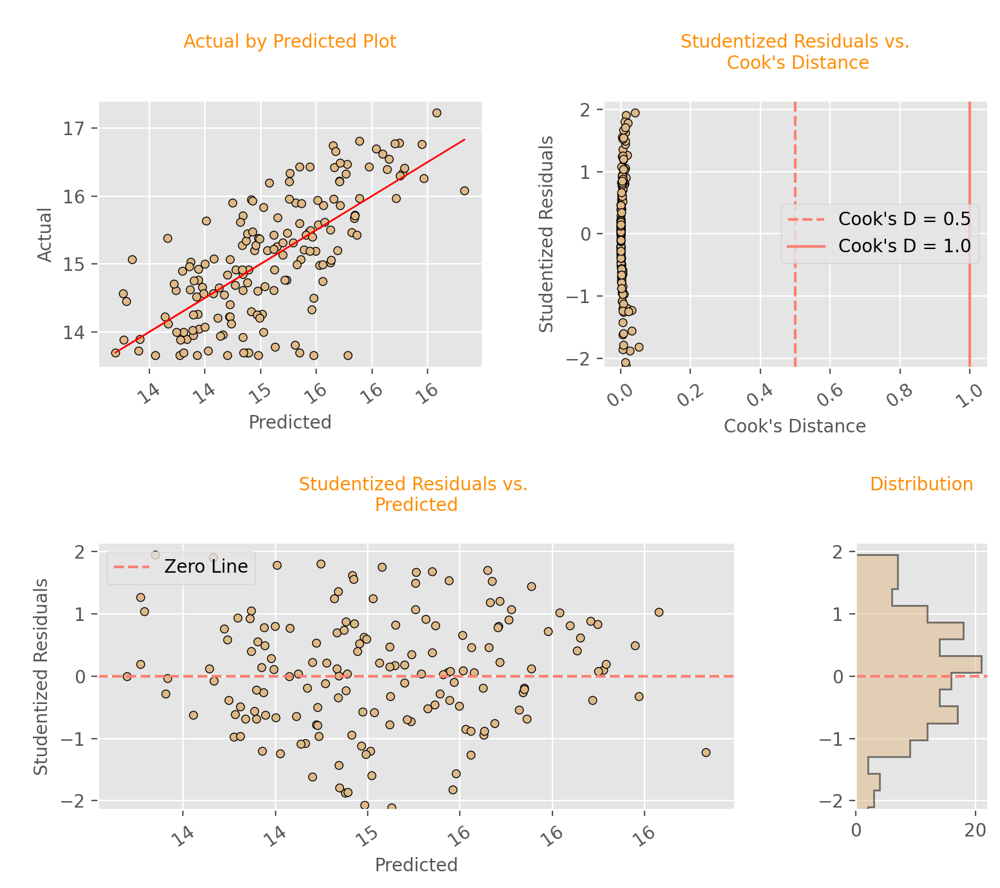

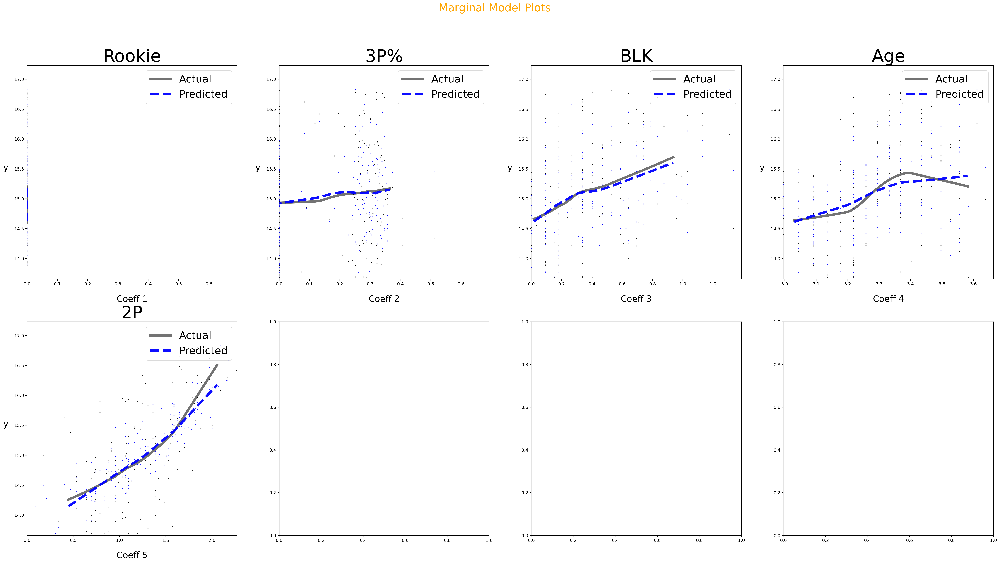

In [69]:
results, fitted_ols_model = ols_regression(
    y = y_train,
    X = X_train,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

### Adjust for possible interaction terms

In [70]:
# make an interaction term with Age and Rookie. 
# square 2P
# square Age
# cube Age

X_train['Age*Rookie'] = X_train['Age']*X_train['Rookie']
X_train['Age*Age'] = X_train['Age']*X_train['Age']
X_train['2P*2P'] = X_train['2P']*X_train['2P']
X_train['Age*Age*Age'] = X_train['Age']*X_train['Age']*X_train['Age']
X_train

,Rookie,3P%,BLK,Age,2P,Age*Rookie,Age*Age,2P*2P,Age*Age*Age
Player,,,,,,,,,
Jeremy Lamb,0.693147,0.262364,0.095310,3.044522,0.530628,2.110302,9.269117,0.281566,28.220034
Randy Foye,0.000000,0.343590,0.262364,3.401197,0.875469,0.000000,11.568144,0.766446,39.345540
Aaron Gray,0.000000,0.000000,0.095310,3.367296,0.741937,0.000000,11.338681,0.550471,38.180694
Glen Davis,0.000000,0.000000,0.470004,3.332205,1.987874,0.000000,11.103587,3.951644,36.999422
Marcus Thornton,0.000000,0.316270,0.095310,3.258097,1.308333,0.000000,10.615193,1.711735,34.585324
...,...,...,...,...,...,...,...,...,...
Kevin Love,0.000000,0.196389,0.405465,3.218876,1.740466,0.000000,10.361162,3.029223,33.351293
Daniel Orton,0.000000,0.000000,0.182322,3.135494,0.641854,0.000000,9.831324,0.411976,30.826059
Eric Maynor,0.000000,0.302571,0.000000,3.258097,0.788457,0.000000,10.615193,0.621665,34.585324


,,
0,RSquare,0.539745
1,RSquare Adj,0.513361
2,Root Mean Square Error,0.188562
3,Mean of Response,15.08093
4,Observations (or Sum Wgts),167


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,9,73.854,73.854,20.4573
1,Error,157,62.957,62.957,Prob > F
2,C.Total,166,136.784,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,650.34912,473.5599,1.37,0.1716,330.19629,970.50195,.
1,Rookie,10.69324,14.1572,0.76,0.4512,1.12219,20.26429,2982.2199
2,3P%,0.60243,0.36414,1.65,0.1001,0.35624,0.84861,3.8781*
3,BLK,0.28737,0.19943,1.44,0.1516,0.15255,0.42219,3.8164*
4,Age,-593.78535,427.03071,-1.39,0.1663,-882.48186,-305.08885,296513.4079
5,2P,-0.07209,0.43497,-0.17,0.8686,-0.36615,0.22198,145.5056
6,Age*Rookie,-3.41828,4.55017,-0.75,0.4536,-6.49444,-0.34211,2939.5461
7,Age*Age,183.72248,128.22797,1.43,0.1539,97.03323,270.41172,1167846.1989
8,2P*2P,0.46483,0.17293,2.69,0.008*,0.34792,0.58173,62.2163
9,Age*Age*Age,-18.85144,12.82152,-1.47,0.1435,-27.5195,-10.18338,289386.3179


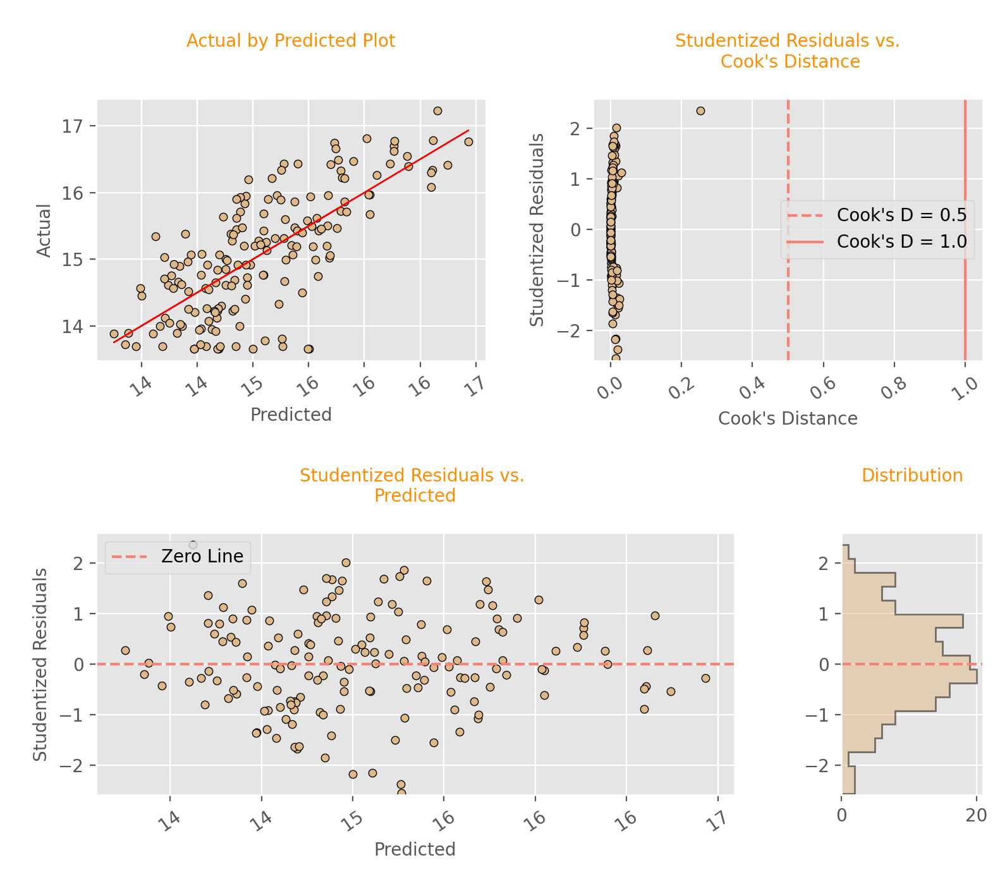

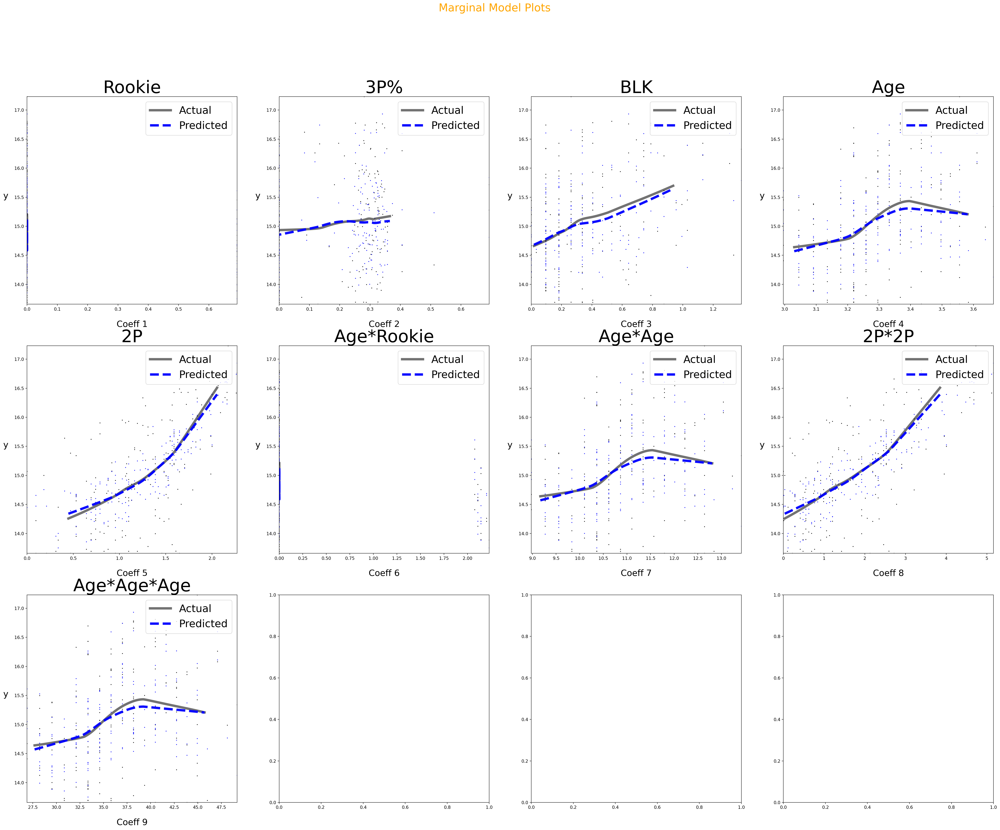

In [71]:
results, fitted_ols_model = ols_regression(
    y = y_train,
    X = X_train,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

In [72]:
X_train = X_train[['Rookie','3P%','BLK','Age*Rookie','2P*2P']]


,,
0,RSquare,0.460905
1,RSquare Adj,0.444163
2,Root Mean Square Error,0.220861
3,Mean of Response,15.08093
4,Observations (or Sum Wgts),167


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,5,63.07,63.07,27.5297
1,Error,161,73.738,73.738,Prob > F
2,C.Total,166,136.784,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,14.16835,0.14049,100.85,<.0001*,14.07338,14.26332,.
1,Rookie,4.92812,11.44734,0.43,0.6674,-2.81047,12.66672,2366.0451
2,3P%,0.40101,0.38183,1.05,0.2952,0.14289,0.65913,2.0089*
3,BLK,0.08857,0.20552,0.43,0.6671,-0.05037,0.22751,2.7919*
4,Age*Rookie,-1.79474,3.72421,-0.48,0.6305,-4.31237,0.72288,2362.768
5,2P*2P,0.45197,0.04697,9.62,<.0001*,0.42021,0.48372,3.7015*


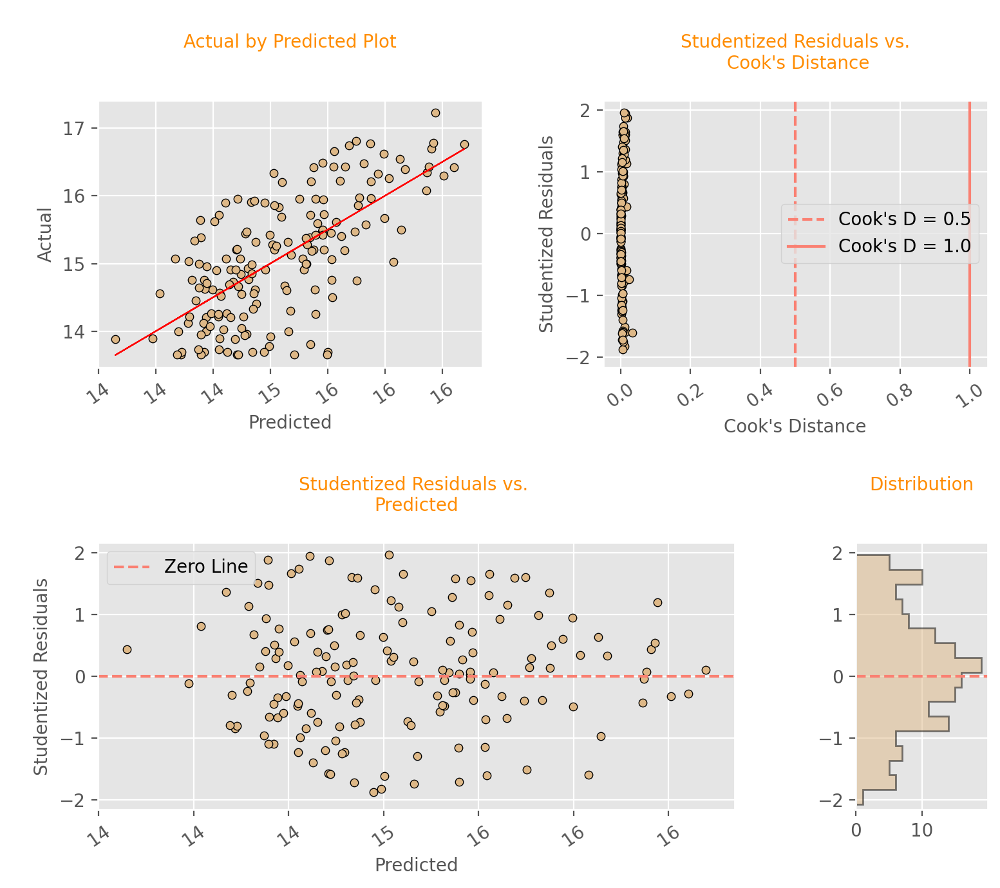

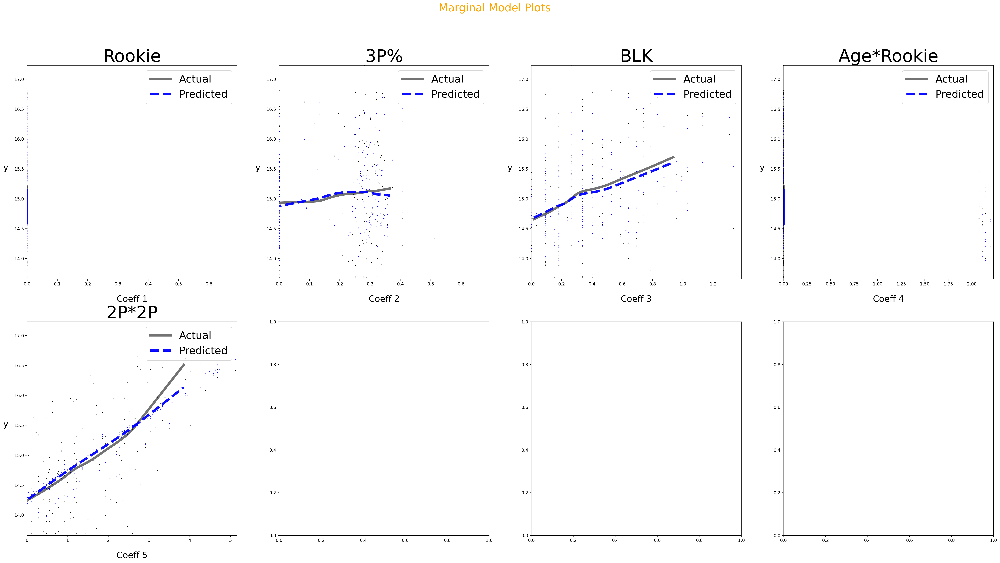

In [73]:
results, fitted_ols_model = ols_regression(
    y = y_train,
    X = X_train,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

,,
0,RSquare,0.460285
1,RSquare Adj,0.446958
2,Root Mean Square Error,0.221116
3,Mean of Response,15.08093
4,Observations (or Sum Wgts),167


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,4,62.984,62.984,34.5395
1,Error,162,73.872,73.872,Prob > F
2,C.Total,166,136.784,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,14.15575,0.13706,103.28,<.0001*,14.06309,14.24841,.
1,3P%,0.43822,0.37098,1.18,0.2392,0.18743,0.689,1.9809*
2,BLK,0.10069,0.20307,0.5,0.6207,-0.03658,0.23797,2.7859*
3,Age*Rookie,-0.19183,0.07957,-2.41,0.017*,-0.24562,-0.13804,1.0919*
4,2P*2P,0.45194,0.04685,9.65,<.0001*,0.42027,0.48361,3.6864*


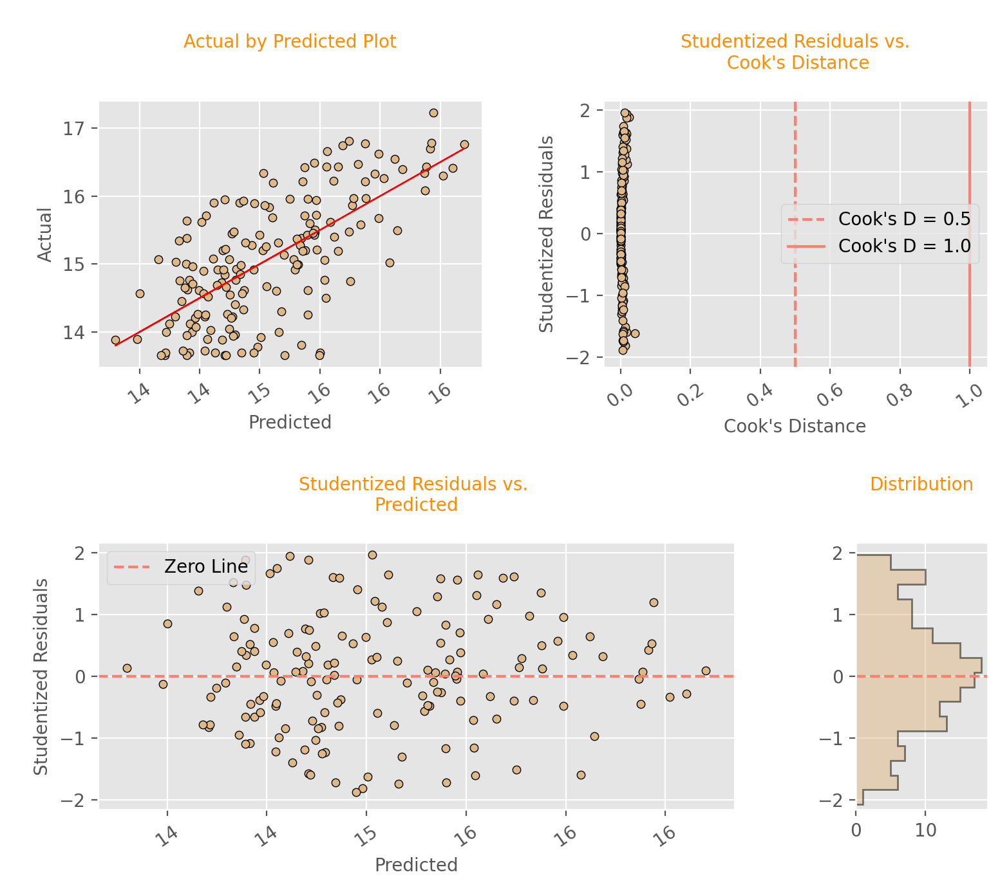

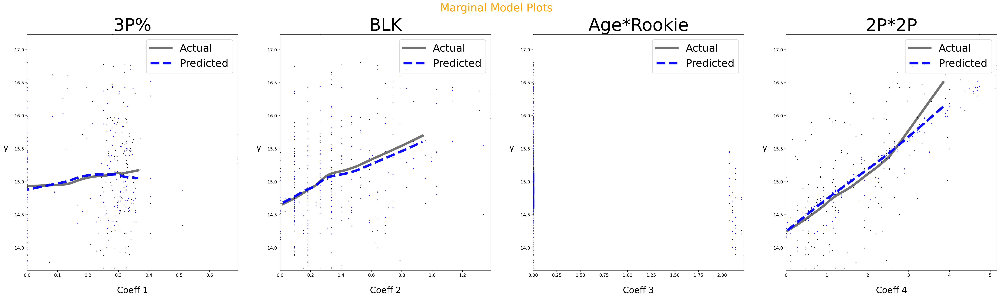

In [74]:
X_train = X_train[['3P%','BLK','Age*Rookie','2P*2P']]
results, fitted_ols_model = ols_regression(
    y = y_train,
    X = X_train,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

,,
0,RSquare,0.455577
1,RSquare Adj,0.448938
2,Root Mean Square Error,0.223044
3,Mean of Response,15.08093
4,Observations (or Sum Wgts),167


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,2,62.34,62.34,68.6183
1,Error,164,74.456,74.456,Prob > F
2,C.Total,166,136.784,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,14.268,0.09609,148.49,<.0001*,14.20305,14.33296,.
1,Age*Rookie,-0.19404,0.07931,-2.45,0.0155*,-0.24765,-0.14043,1.0502*
2,2P*2P,0.46409,0.04159,11.16,<.0001*,0.43597,0.4922,1.0502*


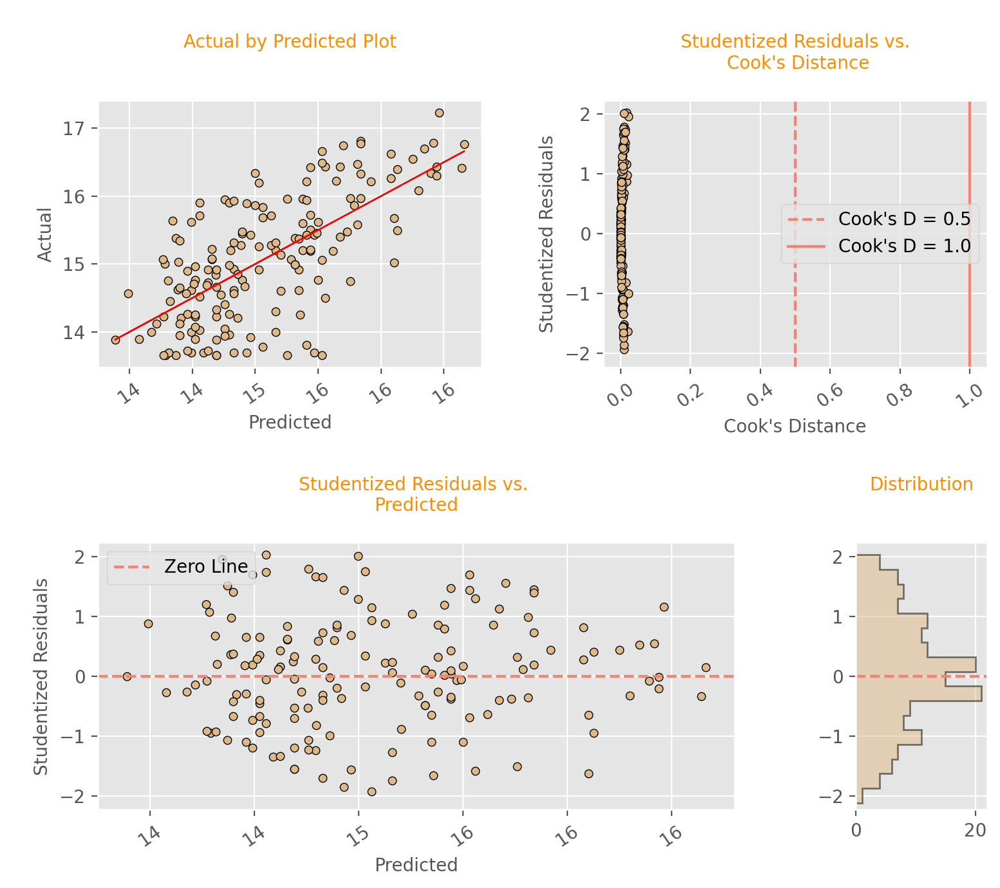

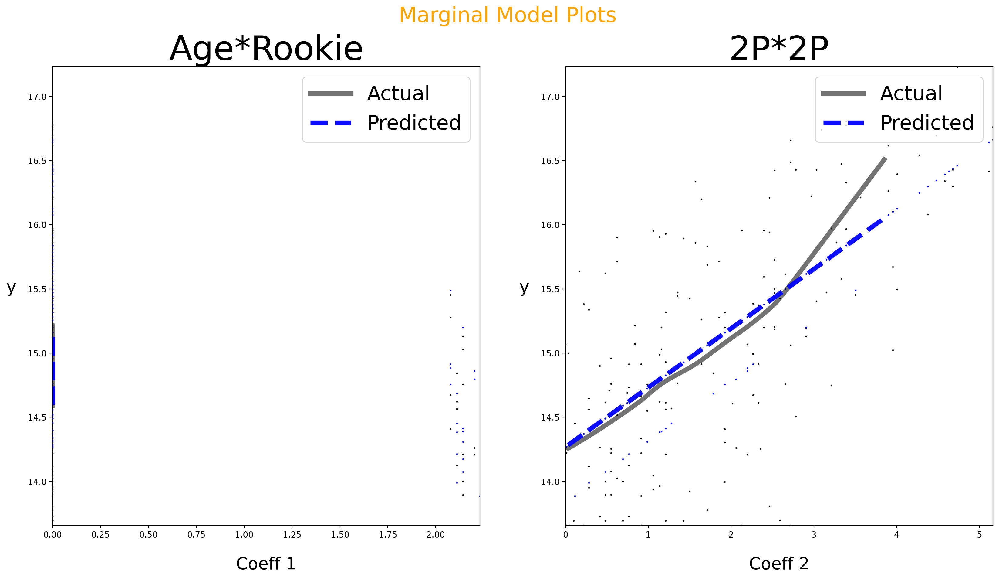

In [75]:
X_train = X_train[['Age*Rookie','2P*2P']]
results, fitted_ols_model = ols_regression(
    y = y_train,
    X = X_train,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)

# Test Set

In [76]:
X_test['Age*Rookie'] = X_test['Age']*X_test['Rookie']
X_test['2P*2P'] = X_test['2P']*X_test['2P']
X_test = X_test[['Age*Rookie','2P*2P']]
X_test

<ipython-input-76-8b07a3c62a90>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['Age*Rookie'] = X_test['Age']*X_test['Rookie']
<ipython-input-76-8b07a3c62a90>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['2P*2P'] = X_test['2P']*X_test['2P']


,Age*Rookie,2P*2P
Player,,
Arnett Moultrie,2.173359,0.986549
Fab Melo,2.173359,0.164402
Darrell Arthur,0.000000,1.711735
Kwame Brown,0.000000,0.345493
Chris Kaman,0.000000,3.029223
...,...,...
Udonis Haslem,0.000000,0.986549
Thaddeus Young,0.000000,4.166580
Joel Anthony,0.000000,0.220903


,,
0,RSquare,0.345704
1,RSquare Adj,0.337773
2,Root Mean Square Error,0.24044
3,Mean of Response,15.06801
4,Observations (or Sum Wgts),168


,Source,Deg of Freedom,Sum of Squares,Mean Square,F Ratio
0,Model,2,42.686,42.686,43.5897
1,Error,165,80.85,80.85,Prob > F
2,C.Total,167,123.413,,<.0001*


,Term,Estimate,Std Error,t Ratio,Prob > |t|,Lower 95%,Upper 95%,VIF
0,Intercept,14.49981,0.09829,147.52,<.0001*,14.43337,14.56625,.
1,Age*Rookie,-0.26423,0.08619,-3.07,0.0025*,-0.32249,-0.20596,1.0225*
2,2P*2P,0.38385,0.04742,8.1,<.0001*,0.3518,0.41591,1.0225*


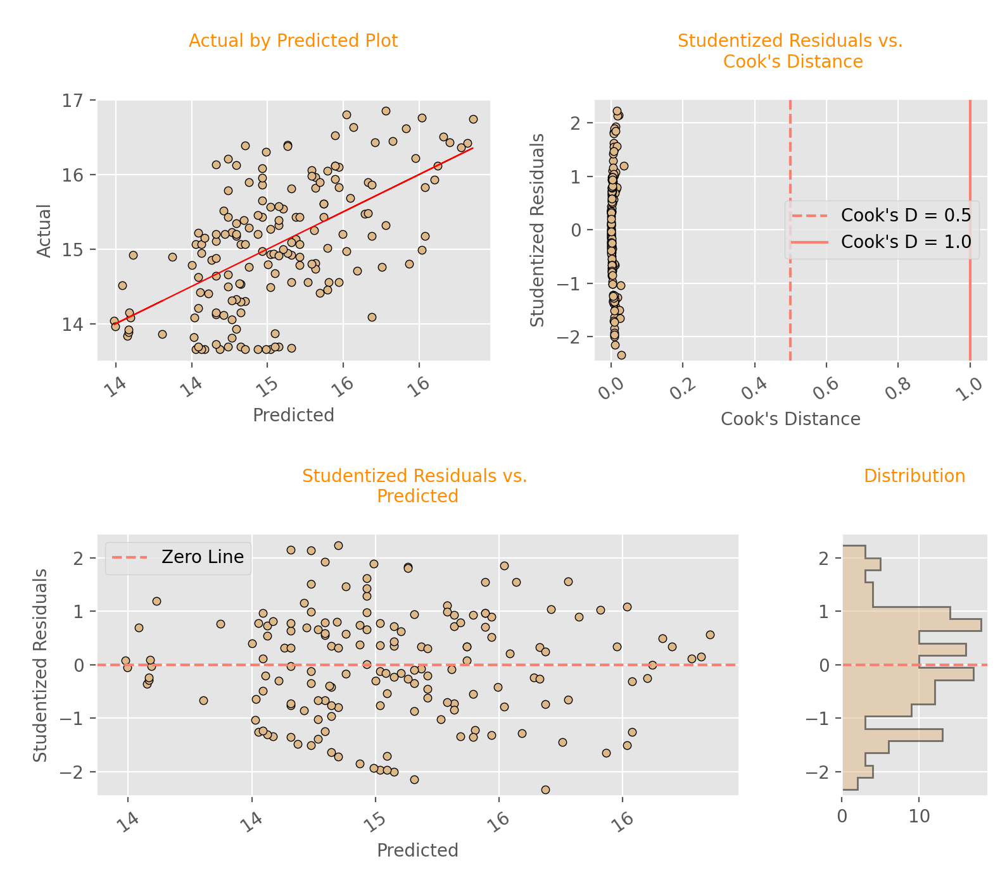

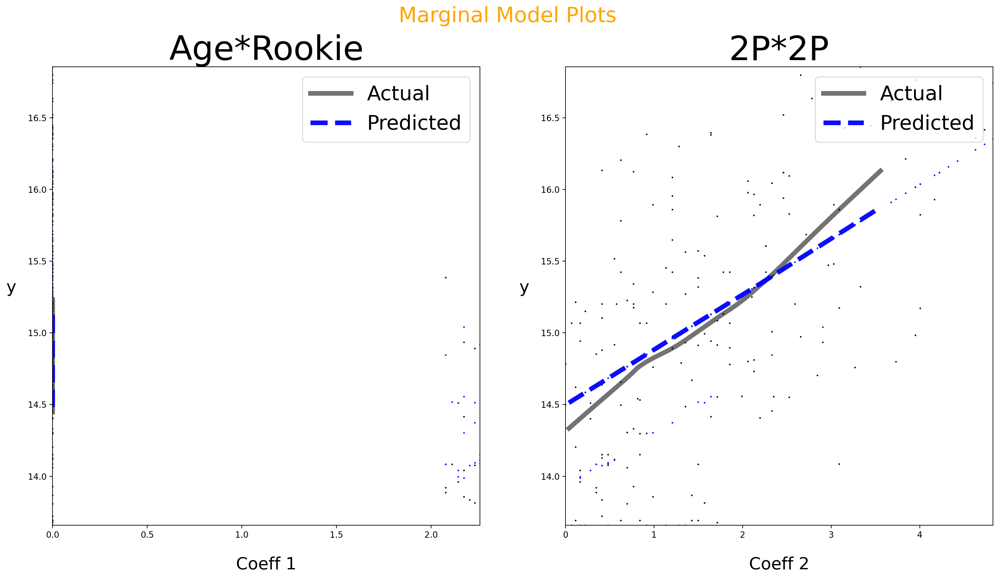

In [77]:
results, fitted_ols_model = ols_regression(
    y = y_test,
    X = X_test,
    add_intercept=True,
    display_summary_of_fit=True,
    display_analysis_of_variance=True,
    display_parameter_estimates=True,
    display_diagnostic_plots=True,
    display_leverage_plots=False,
    display_marginal_model_plots=True,
    return_data=True
)